In [1]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import seaborn as sns
import math
import statistics
import warnings
import numpy as  np
import ast
import re
from scipy.signal import resample
import tkinter as tk
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import pingouin as pg
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')

df = pd.read_json(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\df_manrev.json")

In [2]:
mean_data_points = df['downsampled_traj'].apply(lambda x: len(x)).mean()
print(mean_data_points)
df['new_timestamps'] = df['timestamps']
df['new_timestamps'] = df['downsampled_traj'].apply(lambda x: [i * 0.01 for i in range(len(x))])
df['new_timestamps'] = df['new_timestamps'].apply(lambda x: [round(i, 2) for i in x])

117.91166486096064


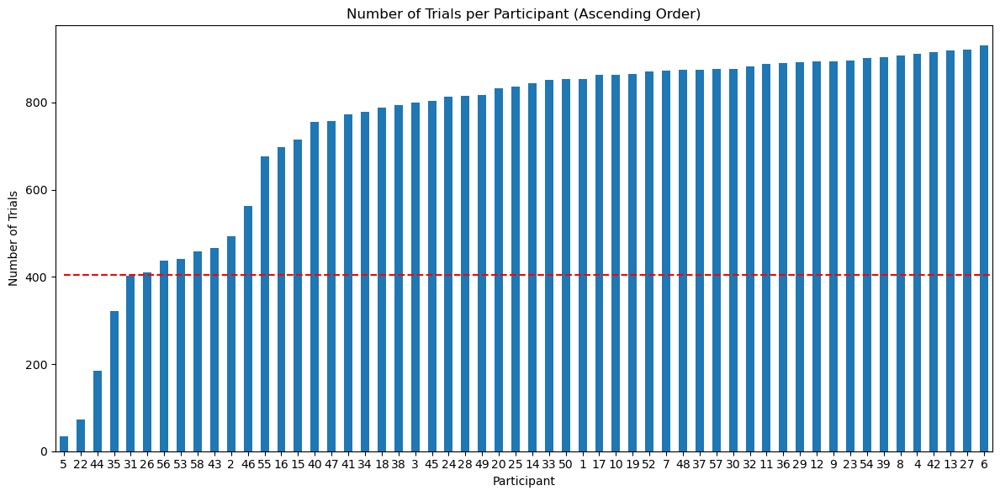

In [3]:
pt_trial = df['pt_num'].value_counts().sort_values(ascending=True)
participants_below_400 = df['pt_num'].value_counts().loc[lambda x: x < 405].index.tolist()
participants_below_400

pt_trial_sorted = pt_trial.sort_values()

plt.figure(figsize=(12, 6))  # Increase the figure size

pt_trial_sorted.plot(kind='bar')
plt.xlabel('Participant')
plt.ylabel('Number of Trials')
plt.title('Number of Trials per Participant (Ascending Order)')
plt.hlines(405, 0, 70, colors='r', linestyles='dashed')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


In [4]:
#Drop participants with less than 400 trials and 31
df = df[~df['pt_num'].isin(participants_below_400)]


In [5]:
def cut_and_fill_traj(traj, length=71):
    last_index = len(traj) - 1
    start_index = max(0, last_index - length + 1)
    end_index = last_index + 1
    
    traj = traj[start_index:end_index]
    
    if len(traj) < length:
        last_x, last_y = traj[-1]
        traj.extend([(last_x, last_y)] * (length - len(traj)))
    
    return traj


In [6]:
def prune_trajectories(df, x_cutoff=810, y_cutoff=390):
    pruned_trajectories = []

    for traj in df['downsampled_traj']:
        pruned_traj = []
        seen_x = False
        seen_y = False
        for x, y in traj:
            if not seen_x and abs(x) <= x_cutoff:
                seen_x = True
            if not seen_y and y <= y_cutoff:
                seen_y = True
            if seen_x and seen_y:
                pruned_traj.append((x, y))
        pruned_trajectories.append(pruned_traj)

    return pruned_trajectories


In [7]:
df['cut_traj'] = [cut_and_fill_traj(traj, length=71) for traj in df['downsampled_traj']]




In [8]:
df['x_values'] = df['cut_traj'].apply(lambda traj: [point[0] for point in traj])
df['y_values'] = df['cut_traj'].apply(lambda traj: [point[1] for point in traj])

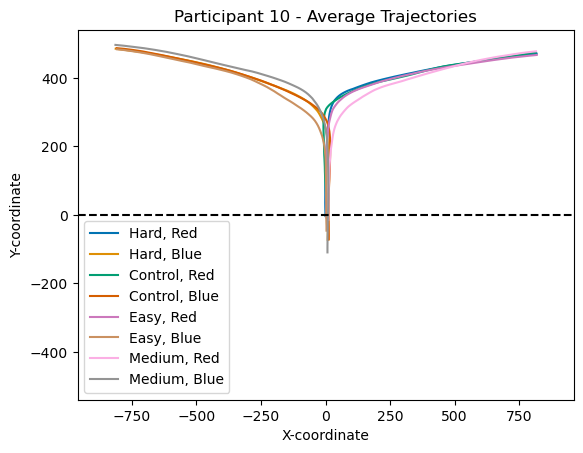

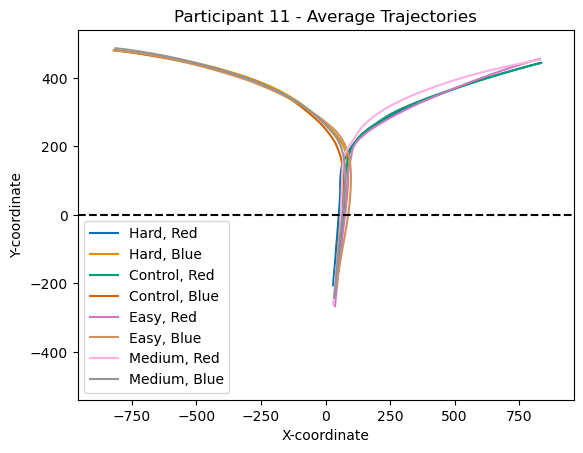

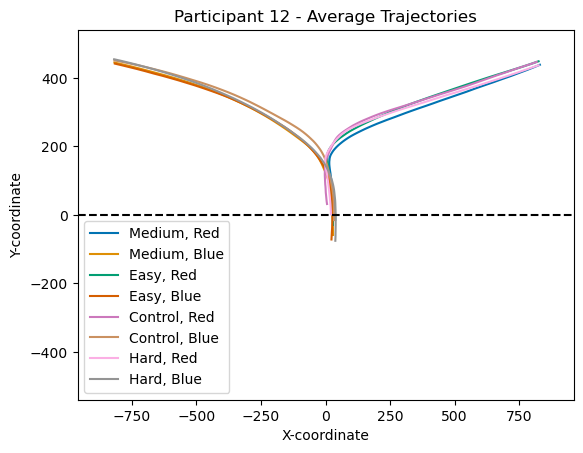

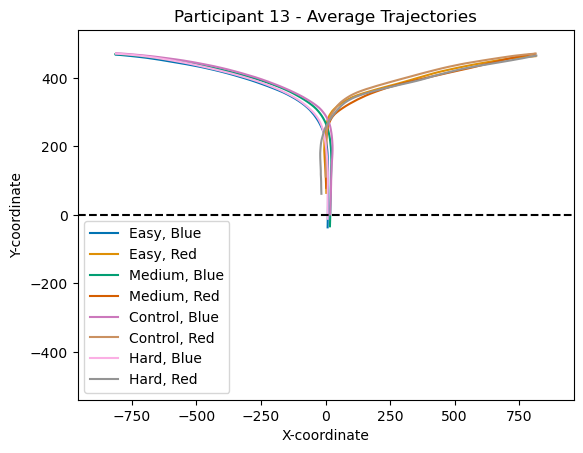

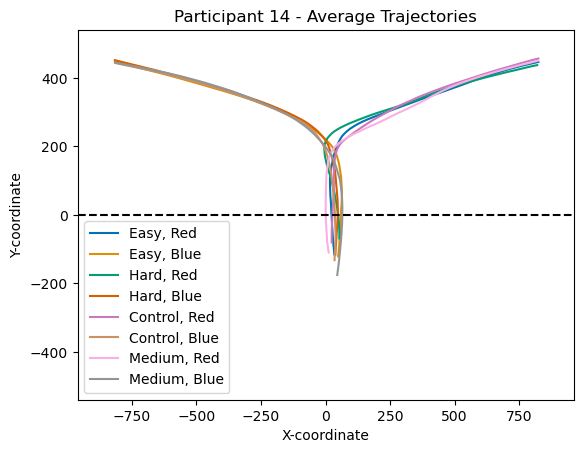

...

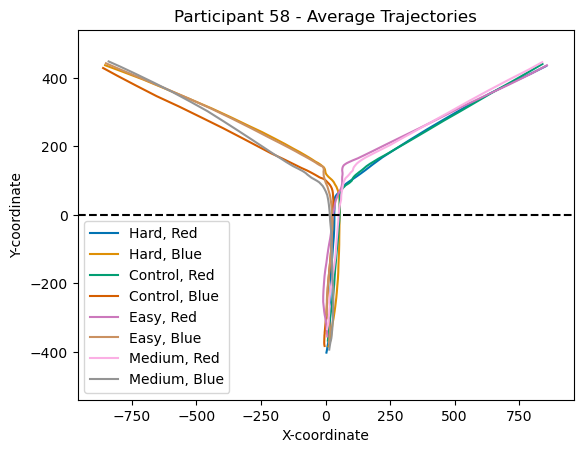

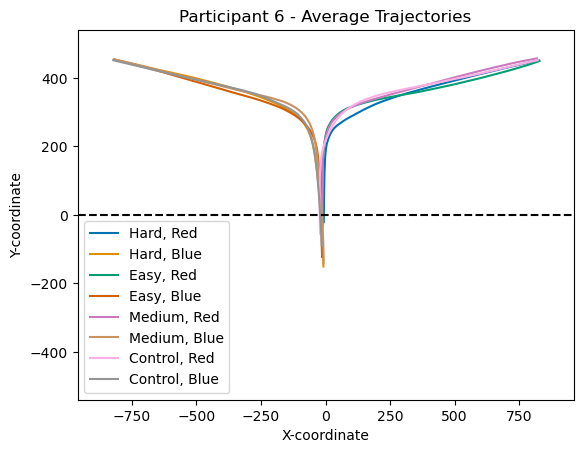

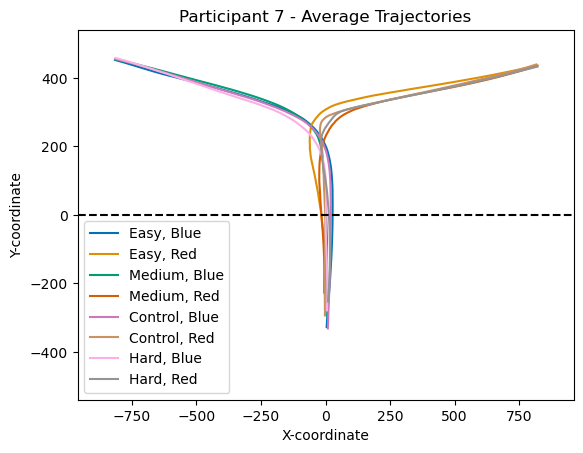

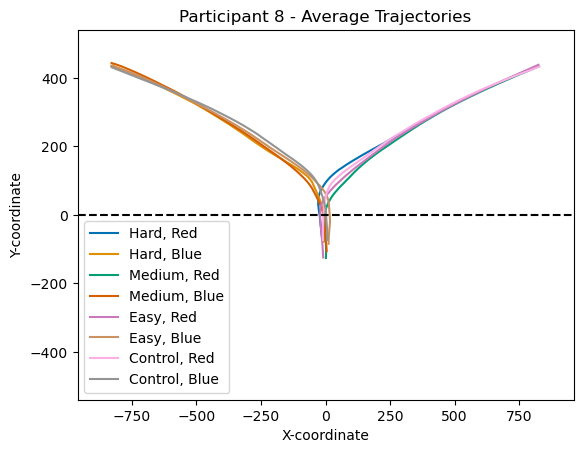

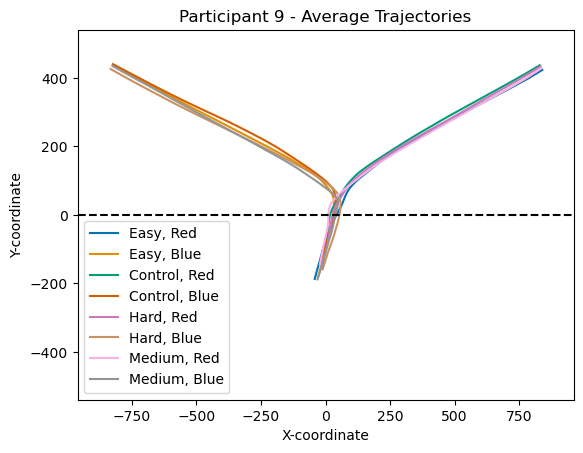

In [9]:
participants = df['pt_num'].unique()

# Set the color palette to colorblind
sns.set_palette("colorblind")

for participant in participants:
    plt.figure()  # Create a new figure for each participant
    
    conditions = df[df['pt_num'] == participant]['difficulty'].unique()
    choices = df[df['pt_num'] == participant]['choice'].unique()
    
    for condition in conditions:
        for choice in choices:
            df_filtered = df[(df['pt_num'] == participant) & (df['difficulty'] == condition) & (df['choice'] == choice)]
            
            average_x_traj = np.nanmean(df_filtered['x_values'].tolist(), axis=0)
            average_y_traj = np.nanmean(df_filtered['y_values'].tolist(), axis=0)
            
            plt.plot(average_x_traj, average_y_traj, label=f'{condition}, {choice}')
    
    plt.xlabel('X-coordinate')
    plt.ylabel('Y-coordinate')
    plt.xlim(-960, 960)
    plt.ylim(-540, 540)
    plt.hlines(0, -960, 960, colors='black', linestyles='dashed')
    plt.title(f'Participant {participant} - Average Trajectories')
    plt.legend()
    #plt.savefig(f'interim plots_1/participant_{participant}_nan_avg.pdf')
    plt.show()
    plt.close()

In [10]:
#Adding C values to the dataframe
def assign_muval(row):
    if row['difficulty'] == 'Control':
        return 0.50
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Blue':
        return 0.455
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Red':
        return 0.545
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Blue':
        return 0.47
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Red':
        return 0.53
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Blue':
        return 0.48
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Red':
        return 0.52

df['muval'] = df.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df['muval_rescaled'] = scaler.fit_transform(df['muval'].values.reshape(-1, 1))



In [11]:
data_files = glob.glob(r'../Squircle experiment/data/*.json')
# Load the dataset
df_raw = pd.DataFrame()
for i in range(len(data_files)):
    temp_df = pd.read_json(data_files[i])
    temp_df['previous_diff'] = temp_df['difficulty'].shift(fill_value=None)
    temp_df['previous_trueval'] = temp_df['true_value'].shift(fill_value=None)
    df_raw = pd.concat([df_raw, temp_df])
df_raw = df_raw[(df_raw['block_number'] != 'Training')]
df_raw = df_raw.drop(df_raw.columns[df_raw.columns.str.contains('Unnamed', case=False)], axis=1)

In [12]:
#Adding C values to the dataframe
def assign_muval(row):
    if row['previous_diff'] == 'Control':
        return 0.50
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Blue':
        return 0.455
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Red':
        return 0.545
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Blue':
        return 0.47
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Red':
        return 0.53
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Blue':
        return 0.48
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Red':
        return 0.52
    else:
        return 'NAN'

df_raw['prev_evidence'] = df_raw.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df_raw['prev_evidence_rescaled'] = scaler.fit_transform(df_raw['prev_evidence'].values.reshape(-1, 1))

In [13]:
# Check if 'previous_evidence_rescaled' column exists in df_raw
df_11 = df.merge(df_raw[['trial_nbr', 'pt_num', 'prev_evidence_rescaled']], on=['trial_nbr', 'pt_num'], how='left')
df_11 = df_11.drop_duplicates(subset=['trial_nbr', 'pt_num'], keep='first')


In [14]:
#time = list(range(-100, 71 * 10, 10))
df_lm = df_11[df_11['trial_nbr'] != 1]
df_lm = df_lm.sort_values(['pt_num', 'trial_nbr'])
df_lm = df_lm[df_lm['previous_response'] != 'NAN']
df_lm['previous_response'] = df_lm['previous_response'].apply(lambda x: 1 if x == 'Red' else - 1)
df_lm = df_lm.reset_index(drop=True)

Participant 10, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.545
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.201
Time:                        00:49:56   Log-Likelihood:                -4420.8
No. Observations:                 826   AIC:                             8850.
Df Residuals:                     822   BIC:                             8868.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0701   

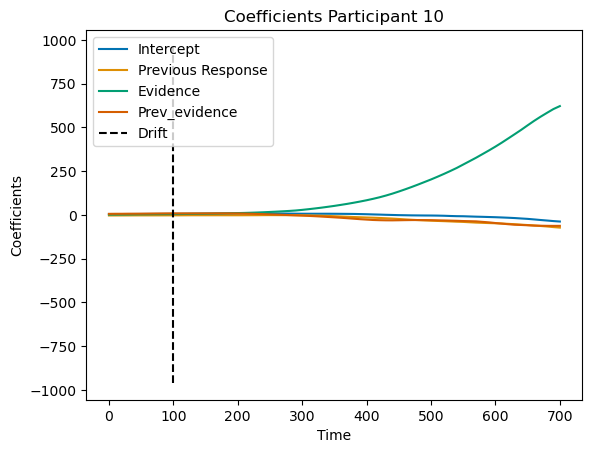

Participant 11, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8519
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.466
Time:                        00:49:58   Log-Likelihood:                -4688.9
No. Observations:                 849   AIC:                             9386.
Df Residuals:                     845   BIC:                             9405.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         37.5980   

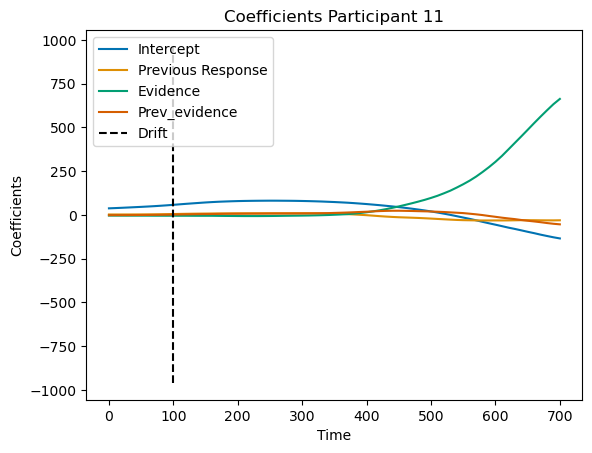

Participant 12, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     3.820
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00979
Time:                        00:49:59   Log-Likelihood:                -4924.0
No. Observations:                 858   AIC:                             9856.
Df Residuals:                     854   BIC:                             9875.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         24.7354   

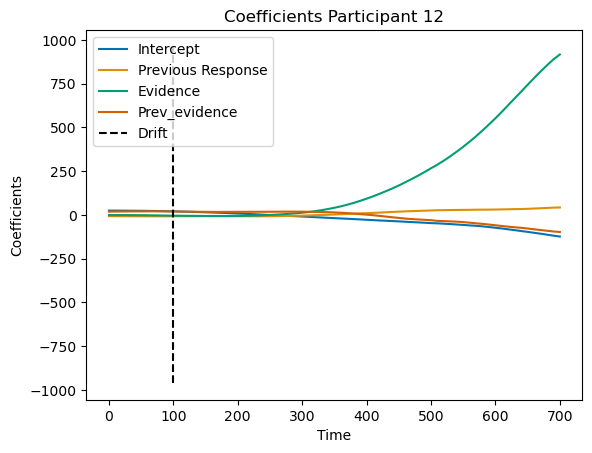

Participant 13, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     5.082
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00171
Time:                        00:50:00   Log-Likelihood:                -5020.0
No. Observations:                 904   AIC:                         1.005e+04
Df Residuals:                     900   BIC:                         1.007e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9220   

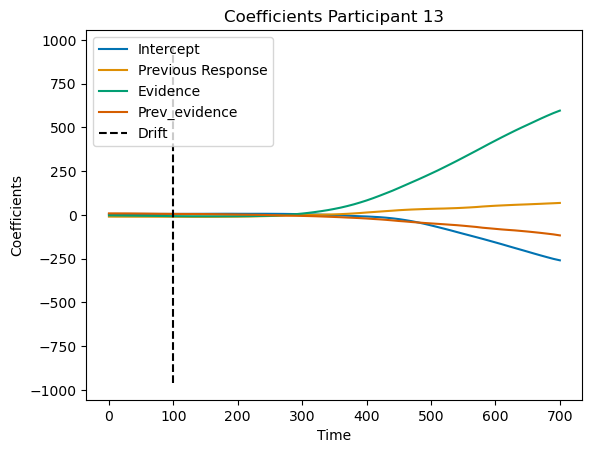

Participant 14, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     6.269
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000330
Time:                        00:50:01   Log-Likelihood:                -5040.3
No. Observations:                 824   AIC:                         1.009e+04
Df Residuals:                     820   BIC:                         1.011e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         38.2263   

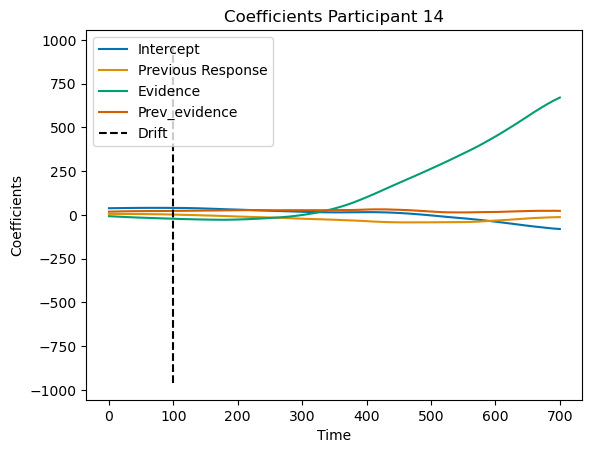

Participant 15, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     2.689
Date:                Thu, 23 May 2024   Prob (F-statistic):             0.0455
Time:                        00:50:02   Log-Likelihood:                -3668.9
No. Observations:                 668   AIC:                             7346.
Df Residuals:                     664   BIC:                             7364.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.4371   

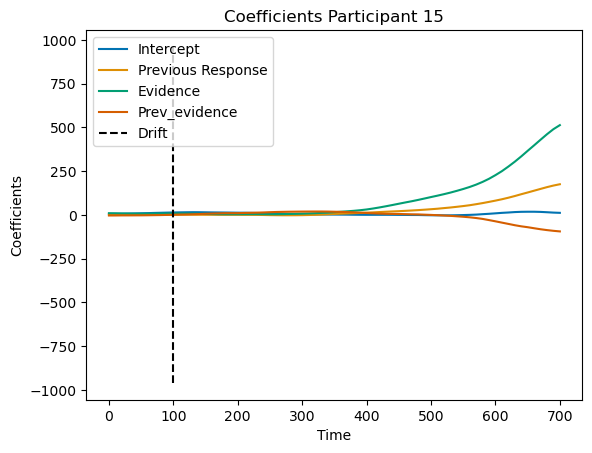

Participant 16, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     6.182
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000381
Time:                        00:50:03   Log-Likelihood:                -4072.8
No. Observations:                 668   AIC:                             8154.
Df Residuals:                     664   BIC:                             8172.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3549   

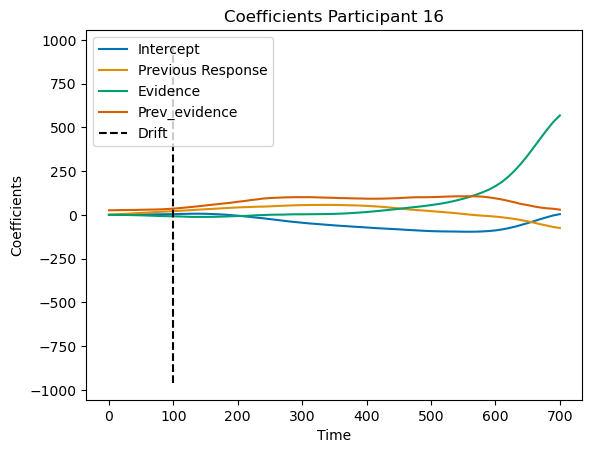

Participant 17, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     9.983
Date:                Thu, 23 May 2024   Prob (F-statistic):           1.81e-06
Time:                        00:50:04   Log-Likelihood:                -4484.0
No. Observations:                 845   AIC:                             8976.
Df Residuals:                     841   BIC:                             8995.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.5597   

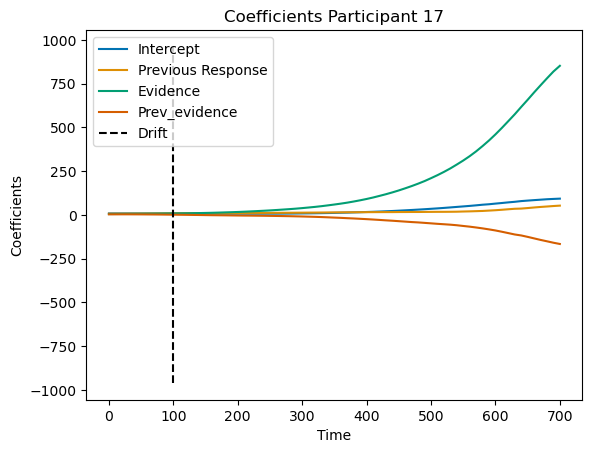

Participant 18, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.470
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.221
Time:                        00:50:06   Log-Likelihood:                -4499.3
No. Observations:                 788   AIC:                             9007.
Df Residuals:                     784   BIC:                             9025.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8705   

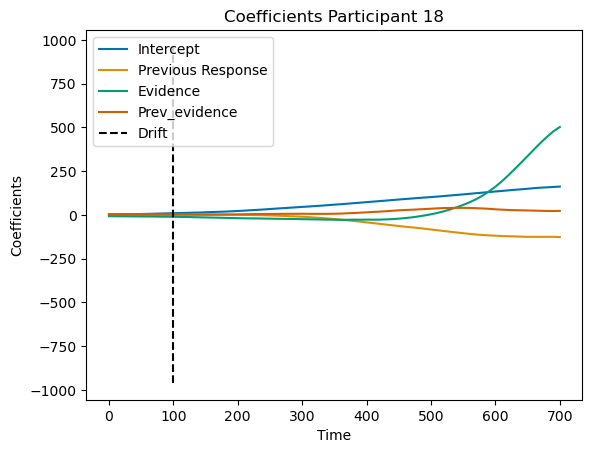

Participant 19, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     4.841
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00240
Time:                        00:50:07   Log-Likelihood:                -4349.1
No. Observations:                 840   AIC:                             8706.
Df Residuals:                     836   BIC:                             8725.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.7023   

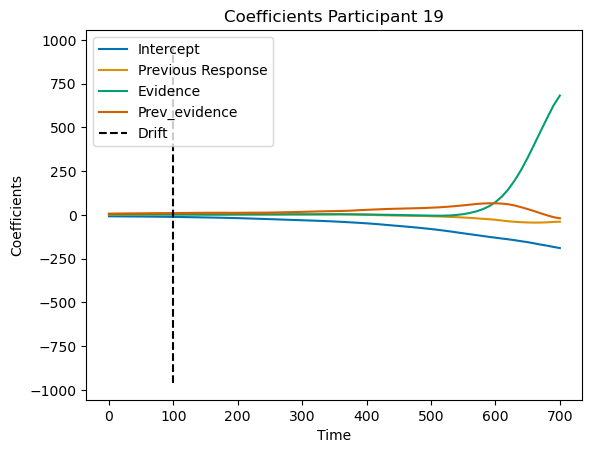

Participant 1, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.5942
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.619
Time:                        00:50:08   Log-Likelihood:                -3886.7
No. Observations:                 806   AIC:                             7781.
Df Residuals:                     802   BIC:                             7800.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.8870    

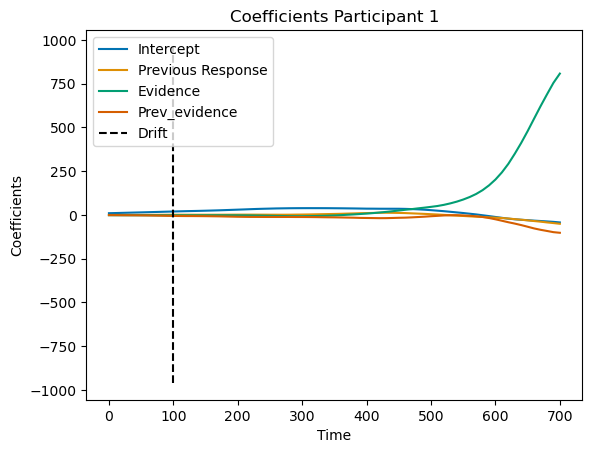

Participant 20, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     5.254
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00136
Time:                        00:50:10   Log-Likelihood:                -4063.2
No. Observations:                 821   AIC:                             8134.
Df Residuals:                     817   BIC:                             8153.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6803   

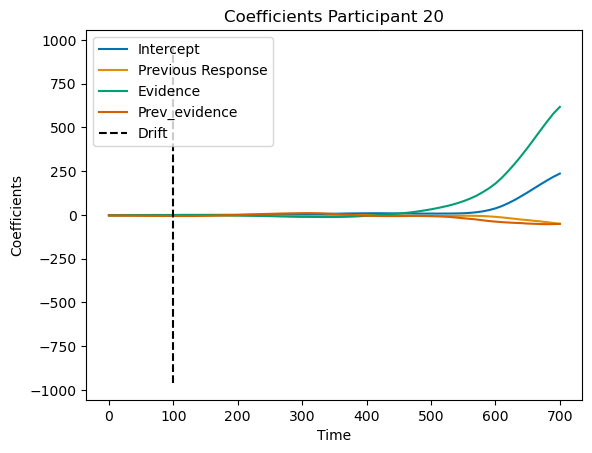

Participant 23, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.1137
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.952
Time:                        00:50:12   Log-Likelihood:                -4670.1
No. Observations:                 866   AIC:                             9348.
Df Residuals:                     862   BIC:                             9367.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2817   

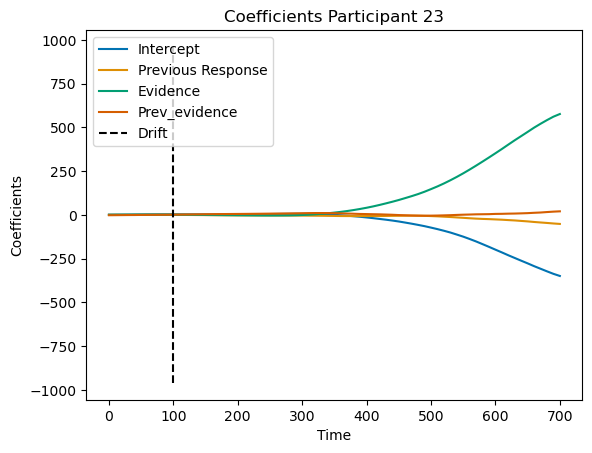

Participant 24, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.115
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.342
Time:                        00:50:13   Log-Likelihood:                -3859.2
No. Observations:                 799   AIC:                             7726.
Df Residuals:                     795   BIC:                             7745.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2851   

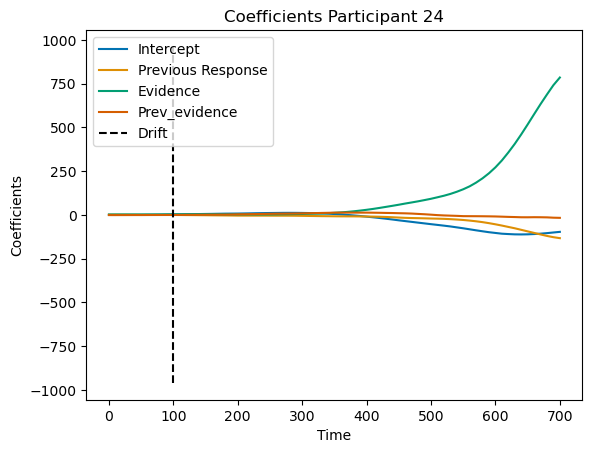

Participant 25, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.4581
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.712
Time:                        00:50:15   Log-Likelihood:                -3429.7
No. Observations:                 815   AIC:                             6867.
Df Residuals:                     811   BIC:                             6886.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0573   

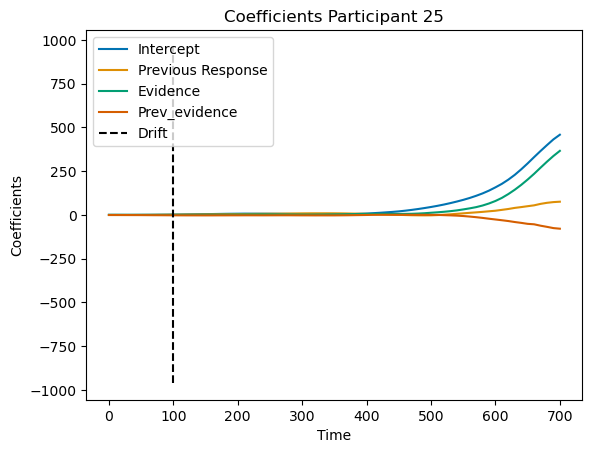

Participant 26, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.569
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.196
Time:                        00:50:16   Log-Likelihood:                -2260.1
No. Observations:                 393   AIC:                             4528.
Df Residuals:                     389   BIC:                             4544.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.2332   

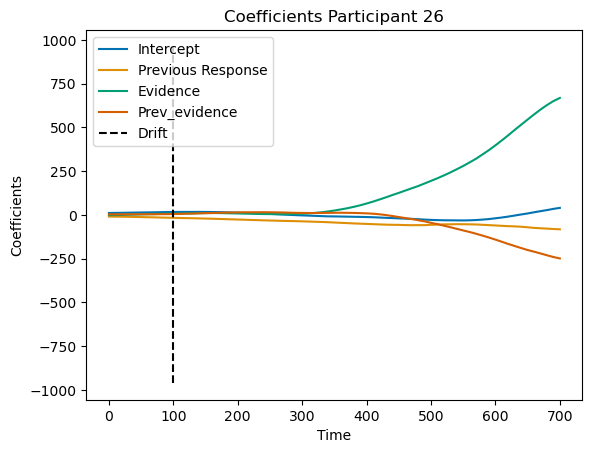

Participant 27, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     3.246
Date:                Thu, 23 May 2024   Prob (F-statistic):             0.0214
Time:                        00:50:17   Log-Likelihood:                -4672.3
No. Observations:                 912   AIC:                             9353.
Df Residuals:                     908   BIC:                             9372.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.3569   

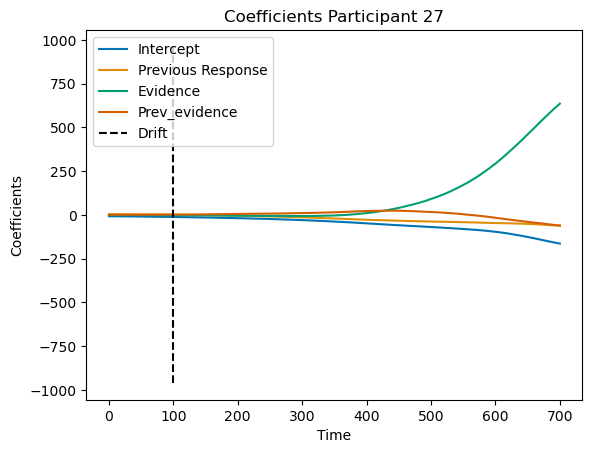

Participant 28, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     6.992
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000121
Time:                        00:50:19   Log-Likelihood:                -4555.8
No. Observations:                 770   AIC:                             9120.
Df Residuals:                     766   BIC:                             9138.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         14.0608   

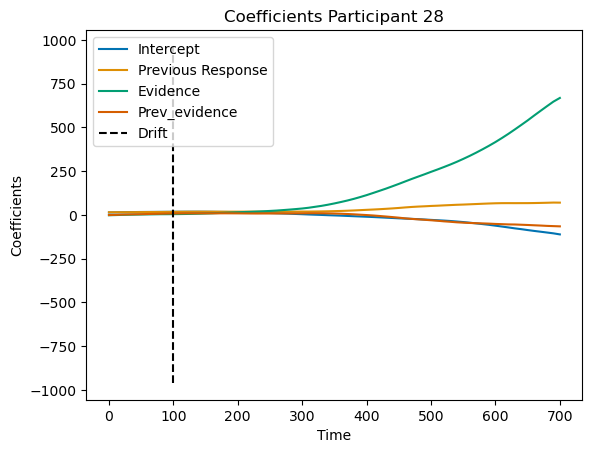

Participant 29, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.034
Method:                 Least Squares   F-statistic:                     10.97
Date:                Thu, 23 May 2024   Prob (F-statistic):           4.50e-07
Time:                        00:50:20   Log-Likelihood:                -4433.3
No. Observations:                 862   AIC:                             8875.
Df Residuals:                     858   BIC:                             8894.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -10.3792   

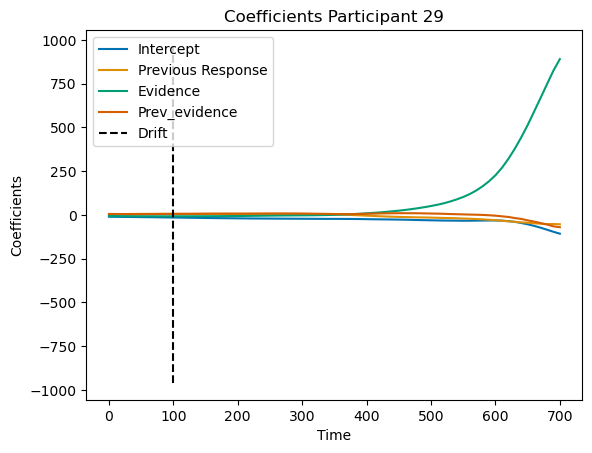

Participant 2, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.001
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.113
Time:                        00:50:21   Log-Likelihood:                -2476.5
No. Observations:                 434   AIC:                             4961.
Df Residuals:                     430   BIC:                             4977.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.4746    

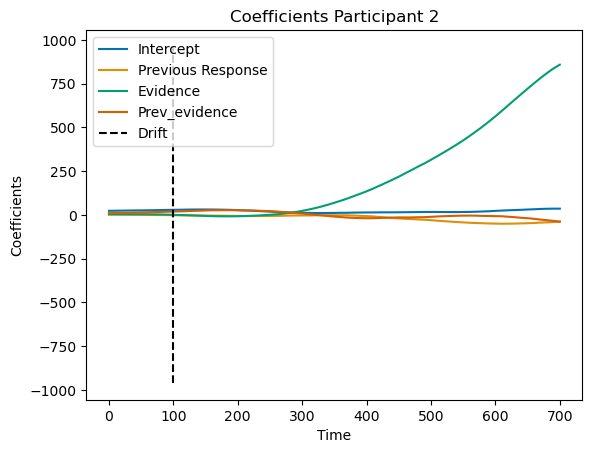

Participant 30, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                     11.71
Date:                Thu, 23 May 2024   Prob (F-statistic):           1.59e-07
Time:                        00:50:22   Log-Likelihood:                -5194.7
No. Observations:                 859   AIC:                         1.040e+04
Df Residuals:                     855   BIC:                         1.042e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -40.8728   

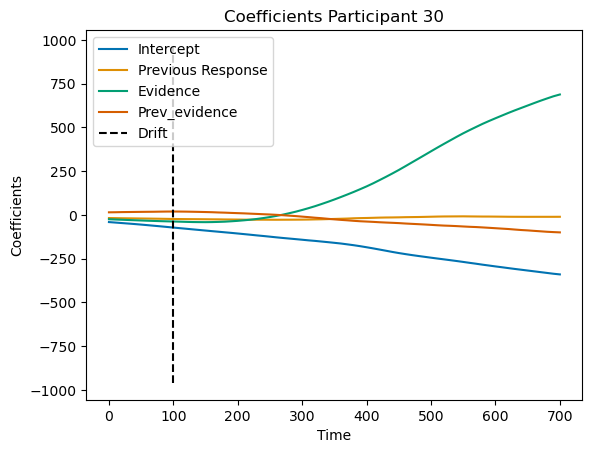

Participant 32, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.351
Date:                Thu, 23 May 2024   Prob (F-statistic):             0.0710
Time:                        00:50:24   Log-Likelihood:                -4768.6
No. Observations:                 853   AIC:                             9545.
Df Residuals:                     849   BIC:                             9564.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.5525   

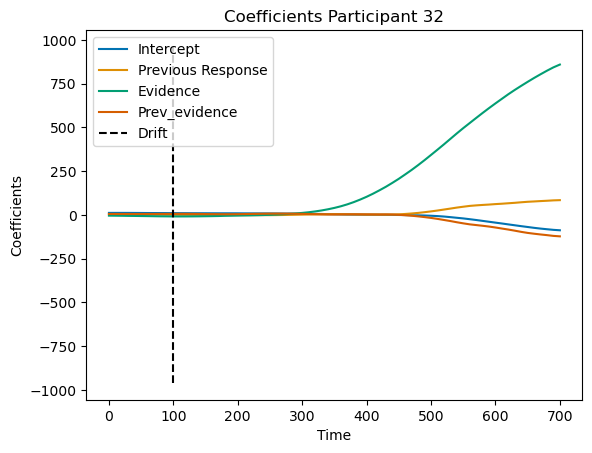

Participant 33, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8020
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.493
Time:                        00:50:26   Log-Likelihood:                -5158.7
No. Observations:                 815   AIC:                         1.033e+04
Df Residuals:                     811   BIC:                         1.034e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9864   

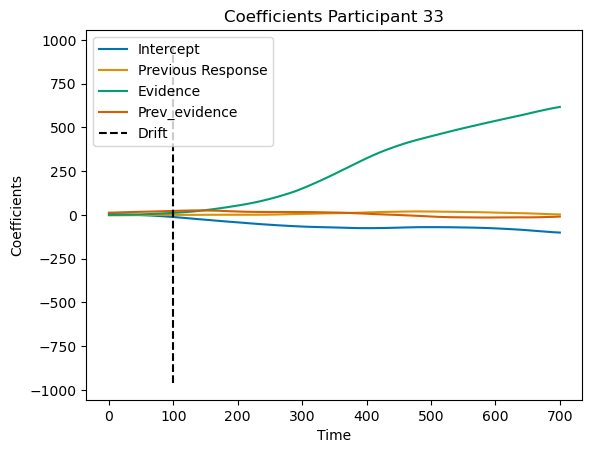

Participant 34, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.048
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     12.02
Date:                Thu, 23 May 2024   Prob (F-statistic):           1.11e-07
Time:                        00:50:28   Log-Likelihood:                -4832.7
No. Observations:                 713   AIC:                             9673.
Df Residuals:                     709   BIC:                             9692.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -29.6292   

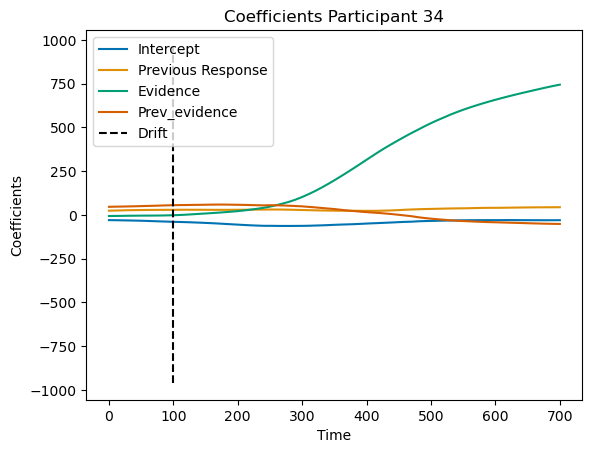

Participant 36, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.5815
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.627
Time:                        00:50:29   Log-Likelihood:                -4232.6
No. Observations:                 864   AIC:                             8473.
Df Residuals:                     860   BIC:                             8492.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0684   

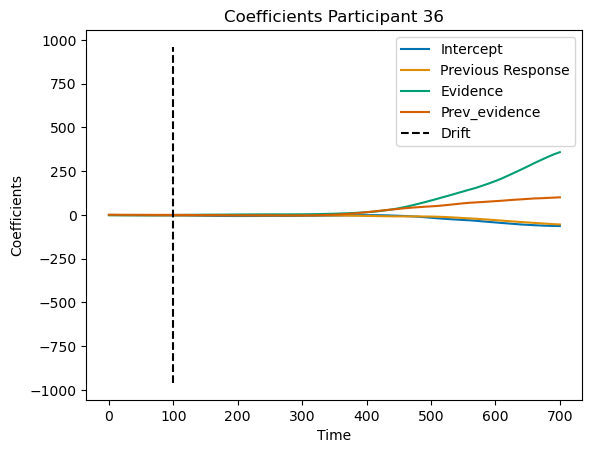

Participant 37, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.361
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.253
Time:                        00:50:30   Log-Likelihood:                -4777.8
No. Observations:                 843   AIC:                             9564.
Df Residuals:                     839   BIC:                             9583.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9121   

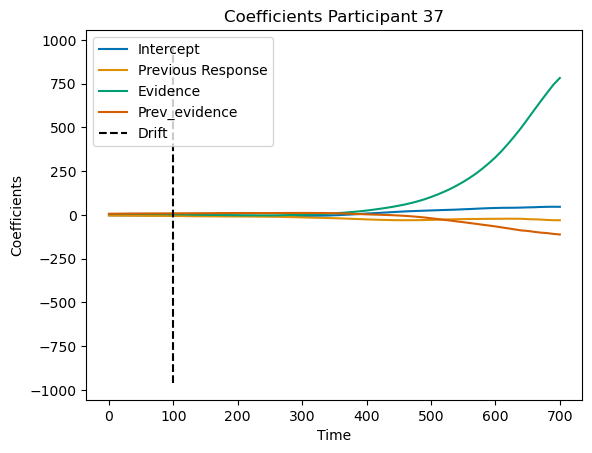

Participant 38, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     5.563
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000886
Time:                        00:50:31   Log-Likelihood:                -3734.8
No. Observations:                 785   AIC:                             7478.
Df Residuals:                     781   BIC:                             7496.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.9804   

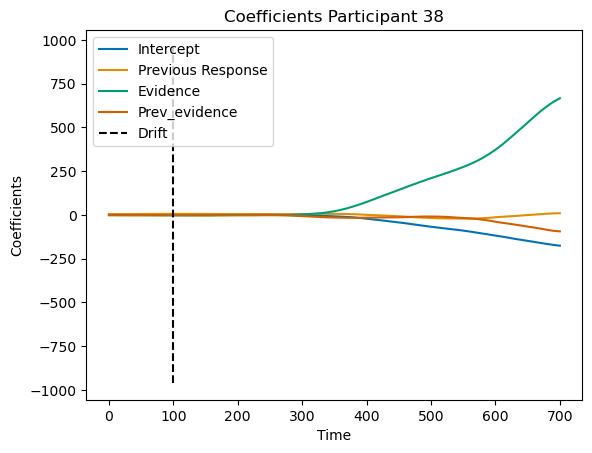

Participant 39, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     6.788
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000158
Time:                        00:50:32   Log-Likelihood:                -5406.9
No. Observations:                 891   AIC:                         1.082e+04
Df Residuals:                     887   BIC:                         1.084e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         44.0764   

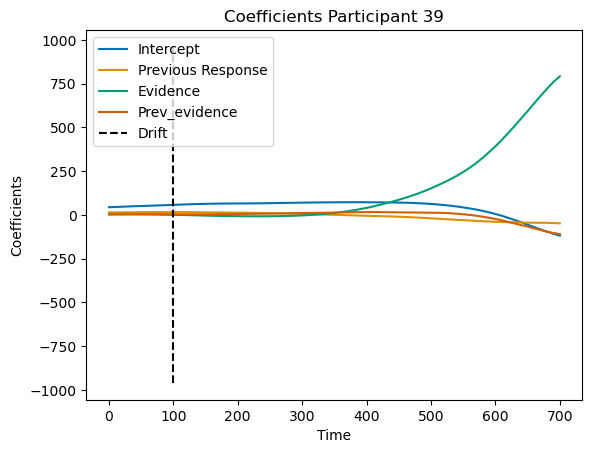

Participant 3, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.2651
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.851
Time:                        00:50:34   Log-Likelihood:                -3647.6
No. Observations:                 704   AIC:                             7303.
Df Residuals:                     700   BIC:                             7321.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.8947    

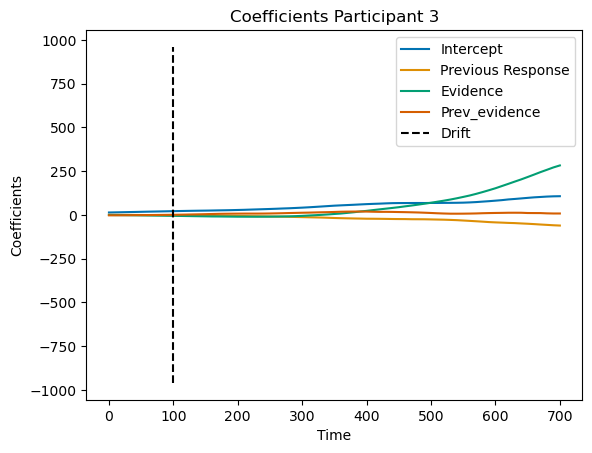

Participant 40, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     6.615
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000207
Time:                        00:50:35   Log-Likelihood:                -4148.3
No. Observations:                 721   AIC:                             8305.
Df Residuals:                     717   BIC:                             8323.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.6510   

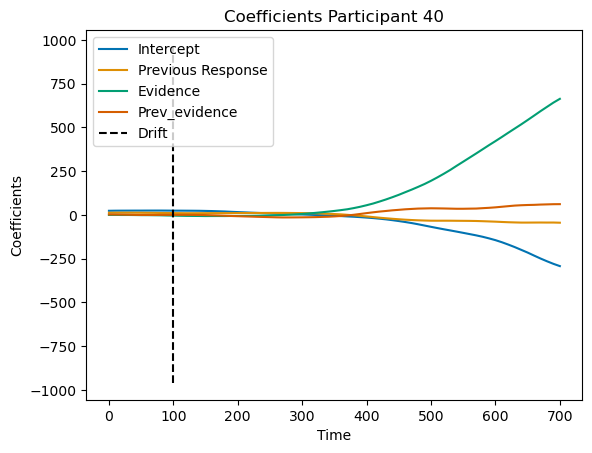

Participant 41, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     4.262
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00537
Time:                        00:50:37   Log-Likelihood:                -4122.7
No. Observations:                 741   AIC:                             8253.
Df Residuals:                     737   BIC:                             8272.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4634   

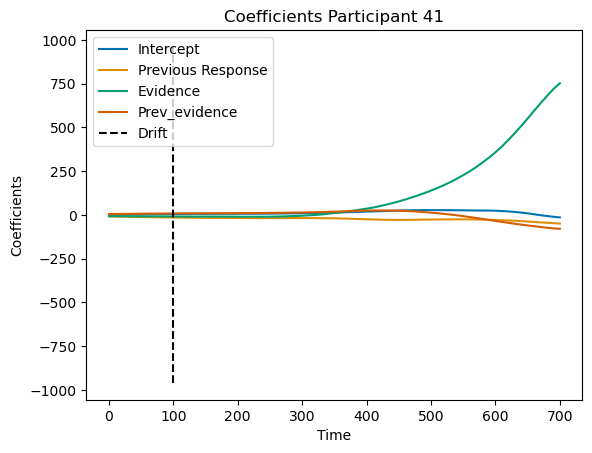

Participant 42, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.974
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.116
Time:                        00:50:38   Log-Likelihood:                -4440.9
No. Observations:                 896   AIC:                             8890.
Df Residuals:                     892   BIC:                             8909.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.4041   

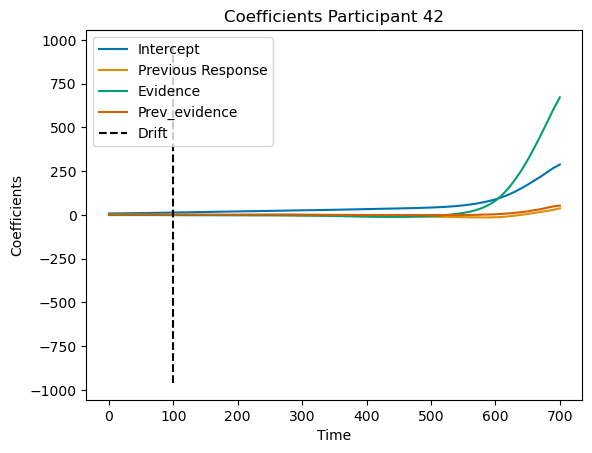

Participant 43, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.3241
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.808
Time:                        00:50:39   Log-Likelihood:                -3017.4
No. Observations:                 464   AIC:                             6043.
Df Residuals:                     460   BIC:                             6059.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.9248   

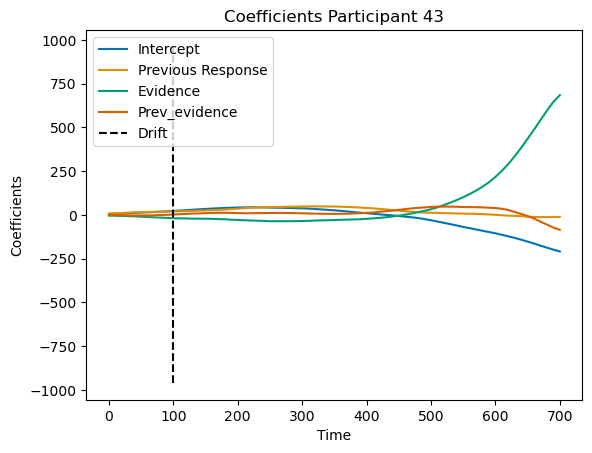

Participant 45, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7335
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.532
Time:                        00:50:40   Log-Likelihood:                -3964.9
No. Observations:                 784   AIC:                             7938.
Df Residuals:                     780   BIC:                             7956.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.0361   

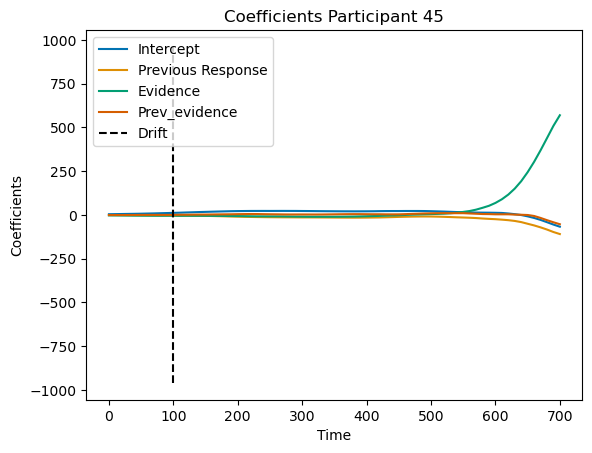

Participant 46, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.449
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.228
Time:                        00:50:41   Log-Likelihood:                -2176.5
No. Observations:                 539   AIC:                             4361.
Df Residuals:                     535   BIC:                             4378.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6631   

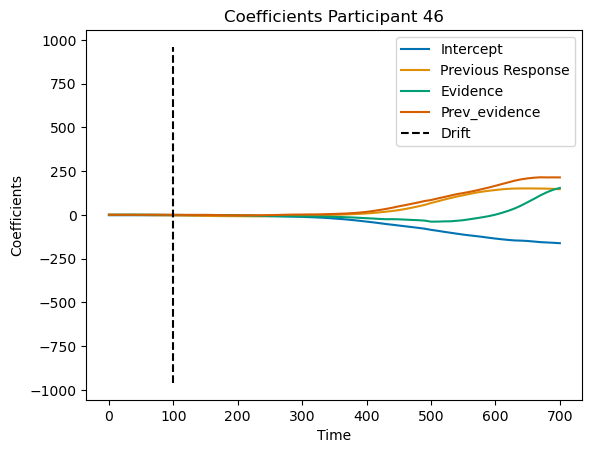

Participant 47, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.2119
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.888
Time:                        00:50:43   Log-Likelihood:                -3888.0
No. Observations:                 692   AIC:                             7784.
Df Residuals:                     688   BIC:                             7802.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         26.6695   

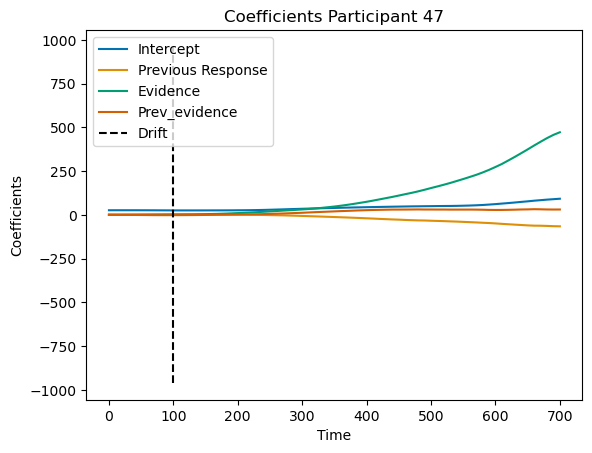

Participant 48, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.528
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00369
Time:                        00:50:44   Log-Likelihood:                -4329.2
No. Observations:                 866   AIC:                             8666.
Df Residuals:                     862   BIC:                             8685.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.0031   

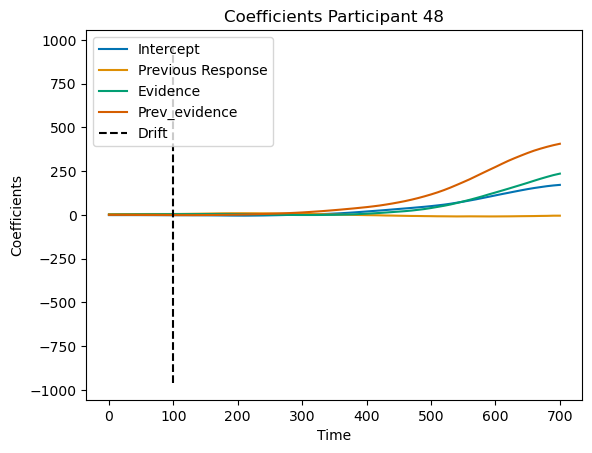

Participant 49, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3798
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.768
Time:                        00:50:45   Log-Likelihood:                -4344.0
No. Observations:                 803   AIC:                             8696.
Df Residuals:                     799   BIC:                             8715.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.9953   

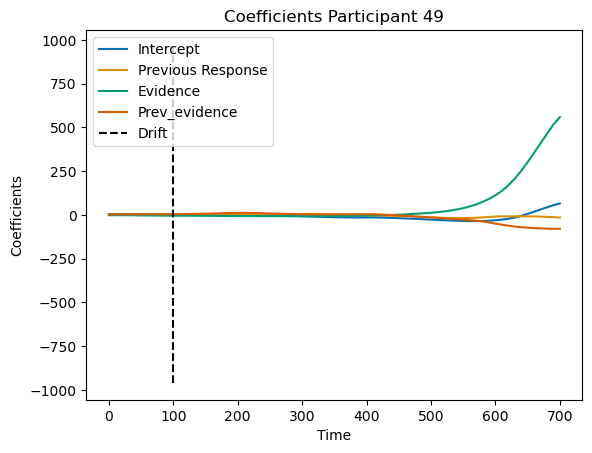

Participant 4, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     4.022
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00741
Time:                        00:50:47   Log-Likelihood:                -4367.3
No. Observations:                 884   AIC:                             8743.
Df Residuals:                     880   BIC:                             8762.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.7864    

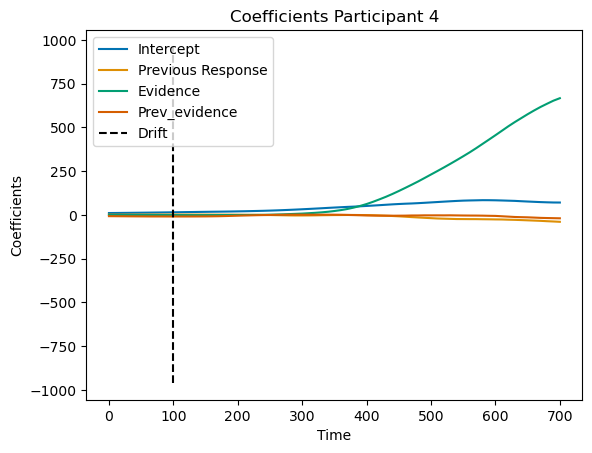

Participant 50, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     13.71
Date:                Thu, 23 May 2024   Prob (F-statistic):           1.00e-08
Time:                        00:50:48   Log-Likelihood:                -4418.9
No. Observations:                 797   AIC:                             8846.
Df Residuals:                     793   BIC:                             8864.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.8494   

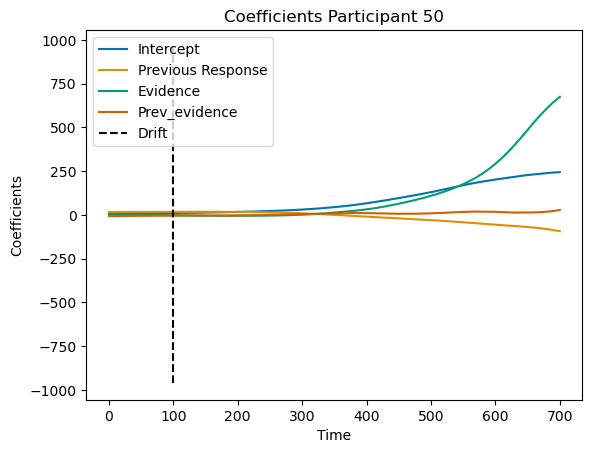

Participant 52, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.336
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.261
Time:                        00:50:49   Log-Likelihood:                -4257.9
No. Observations:                 846   AIC:                             8524.
Df Residuals:                     842   BIC:                             8543.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.5760   

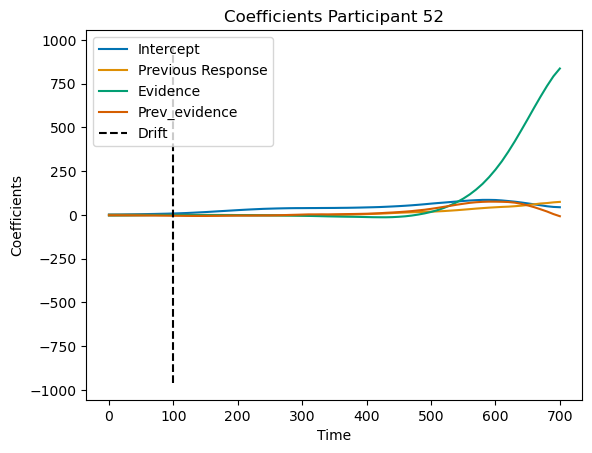

Participant 53, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.439
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.231
Time:                        00:50:50   Log-Likelihood:                -2143.8
No. Observations:                 424   AIC:                             4296.
Df Residuals:                     420   BIC:                             4312.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0585   

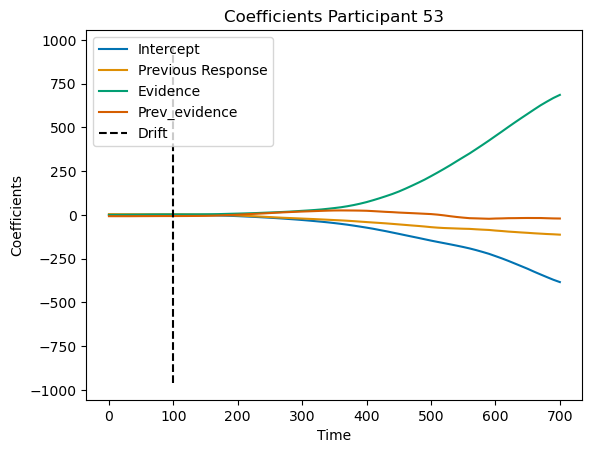

Participant 54, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.951
Date:                Thu, 23 May 2024   Prob (F-statistic):             0.0319
Time:                        00:50:52   Log-Likelihood:                -5041.7
No. Observations:                 884   AIC:                         1.009e+04
Df Residuals:                     880   BIC:                         1.011e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.6574   

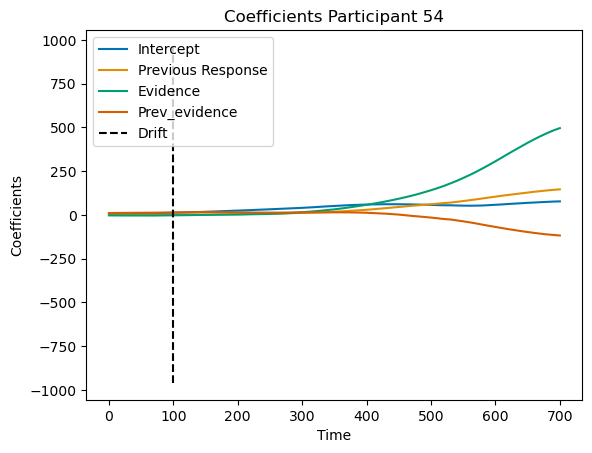

Participant 55, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7842
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.503
Time:                        00:50:54   Log-Likelihood:                -3690.6
No. Observations:                 626   AIC:                             7389.
Df Residuals:                     622   BIC:                             7407.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         32.5221   

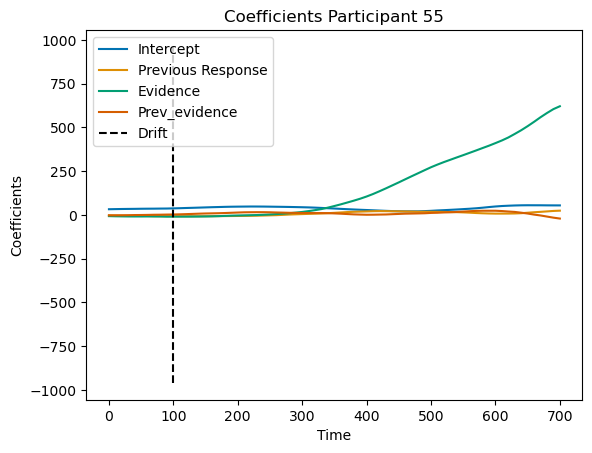

Participant 56, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     6.010
Date:                Thu, 23 May 2024   Prob (F-statistic):           0.000515
Time:                        00:50:56   Log-Likelihood:                -2706.3
No. Observations:                 418   AIC:                             5421.
Df Residuals:                     414   BIC:                             5437.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         32.2730   

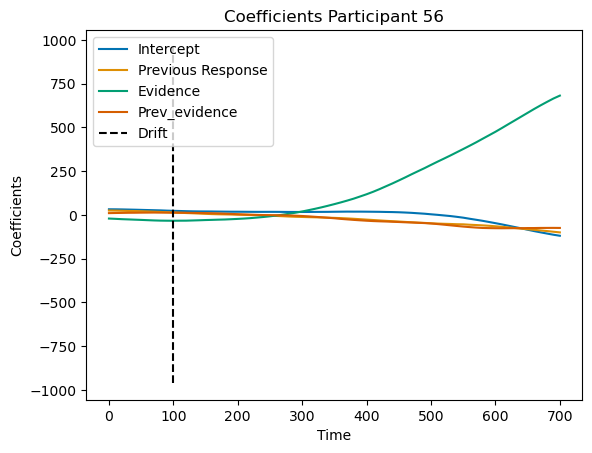

Participant 57, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.2399
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.869
Time:                        00:50:58   Log-Likelihood:                -5289.8
No. Observations:                 853   AIC:                         1.059e+04
Df Residuals:                     849   BIC:                         1.061e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         65.0259   

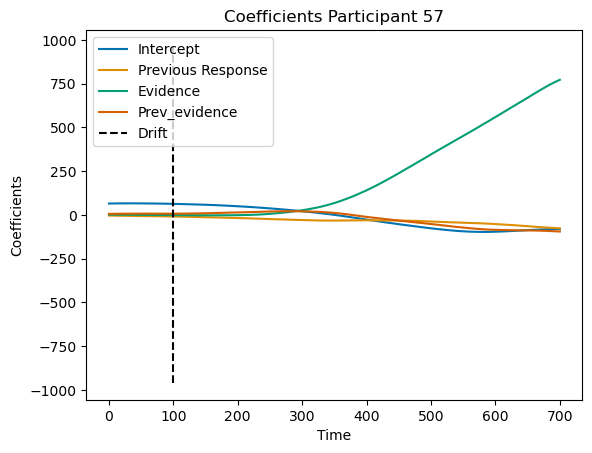

Participant 58, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     4.882
Date:                Thu, 23 May 2024   Prob (F-statistic):            0.00239
Time:                        00:50:59   Log-Likelihood:                -2246.3
No. Observations:                 428   AIC:                             4501.
Df Residuals:                     424   BIC:                             4517.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.4568   

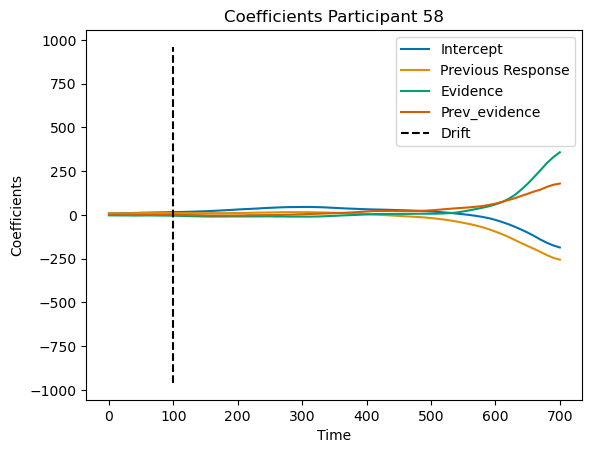

Participant 6, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9013
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.440
Time:                        00:51:01   Log-Likelihood:                -5133.0
No. Observations:                 918   AIC:                         1.027e+04
Df Residuals:                     914   BIC:                         1.029e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.6357    

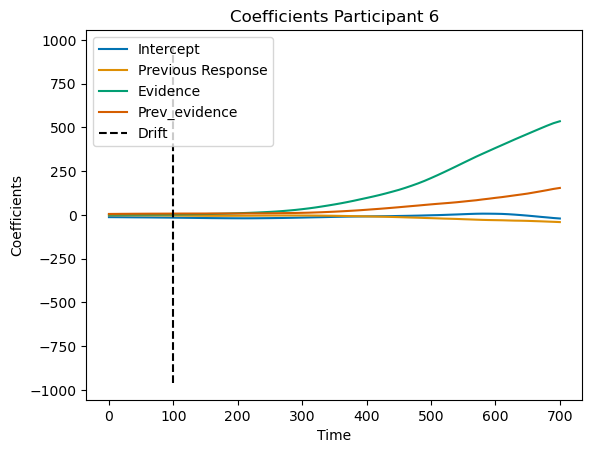

Participant 7, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.051
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.369
Time:                        00:51:03   Log-Likelihood:                -4585.7
No. Observations:                 861   AIC:                             9179.
Df Residuals:                     857   BIC:                             9198.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.7039    

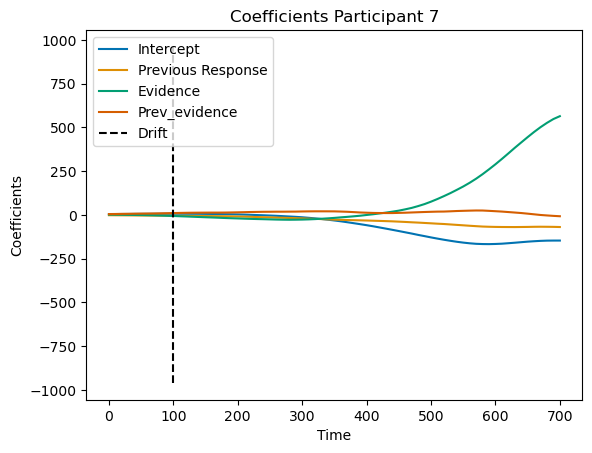

Participant 8, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.991
Date:                Thu, 23 May 2024   Prob (F-statistic):              0.114
Time:                        00:51:05   Log-Likelihood:                -5192.6
No. Observations:                 874   AIC:                         1.039e+04
Df Residuals:                     870   BIC:                         1.041e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.0727    

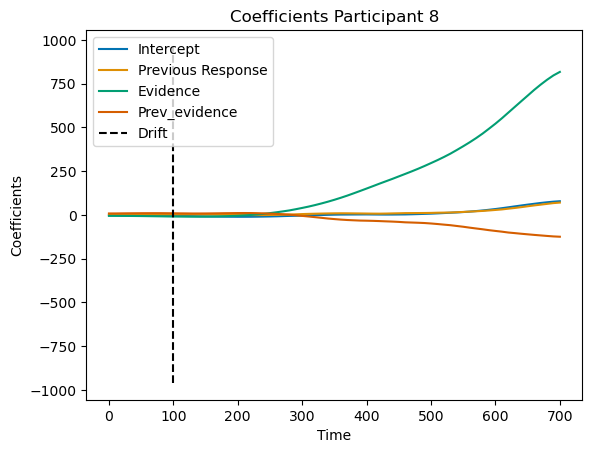

Participant 9, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     10.60
Date:                Thu, 23 May 2024   Prob (F-statistic):           7.57e-07
Time:                        00:51:07   Log-Likelihood:                -5331.9
No. Observations:                 874   AIC:                         1.067e+04
Df Residuals:                     870   BIC:                         1.069e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -24.2275    

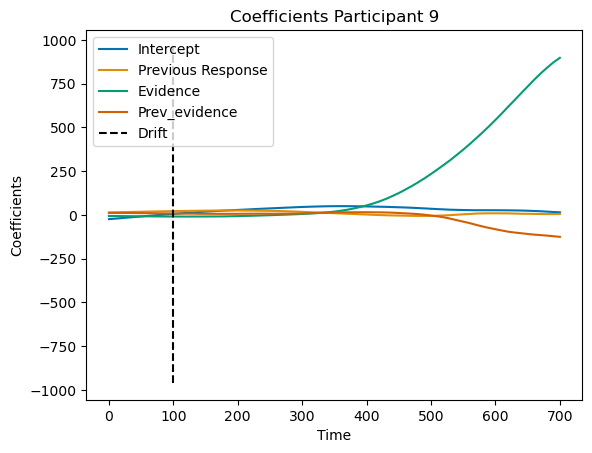

In [15]:
######################################
#Previous Response
######################################
time = list(range(0, 71 * 10, 10))

all_coefs = []
all_Ts = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]
    # One-hot encode the categorical predictor 'true_value'
    #df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['previous_response'])
    df_encoded_participant = df_lm_participant
    

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    Ts = []
    for i in range(0, 71):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        X_categorical = df_cleaned_participant[['previous_response']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        X_numerical_2 = df_cleaned_participant['prev_evidence_rescaled'].values.reshape(-1, 1)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        X = np.concatenate((X_categorical, X_numerical, X_numerical_2), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1], model.params[2], model.params[3]))
        Ts.append((model.tvalues[0], model.tvalues[1], model.tvalues[2], model.tvalues[3]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Intercept',"Previous Response",'Evidence', 'Prev_evidence', "Drift"])
    plt.show()
    all_coefs.append(coefs)
    all_Ts.append(Ts)


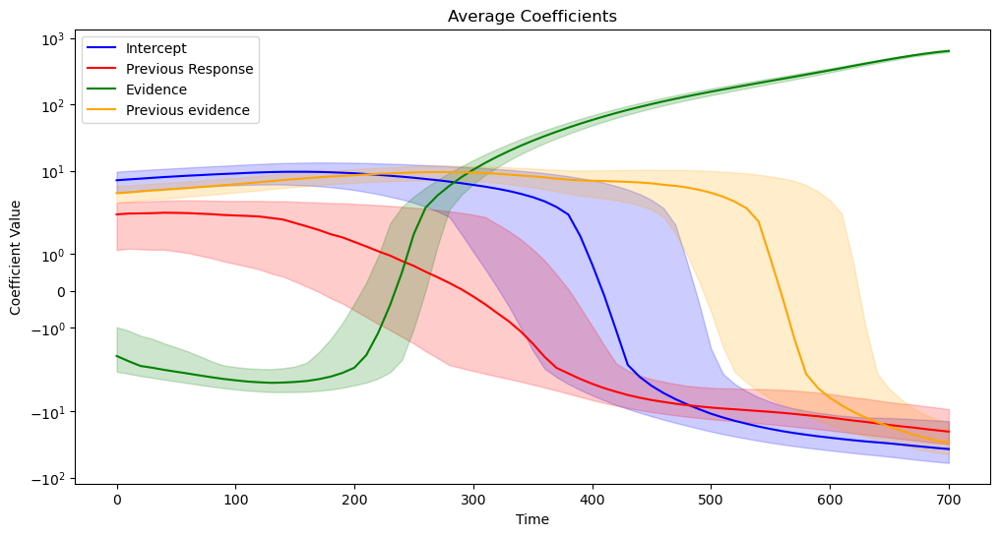

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)


# Extract the x, y, and z values of the coefficients
intercept_coefs = average_coefs[:, 0]
prv_resp_coefs = average_coefs[:, 1]
evidence_coefs = average_coefs[:, 2]
prv_evidence_coefs = average_coefs[:, 3]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])


plt.figure(figsize=(12, 6))
plt.plot(time, intercept_coefs, label='Intercept', color='blue')
plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
plt.plot(time, evidence_coefs, label='Evidence', color='green')
plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_coefs - std_coefs[:, 0], intercept_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], prv_resp_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, evidence_coefs - std_coefs[:, 2], evidence_coefs + std_coefs[:, 2], alpha=0.2, color='green')
plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], prv_evidence_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
#plt.yscale('log')
plt.title('Average Coefficients')
# Add the regression formula as text
#plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
#plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
#plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
#plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
#plt.xticks(np.arange(-100, 710, 100))
#plt.ylim(-100, 960)
#plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
plt.yscale('symlog')
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, x_coefs.max() + factor)
plt.show()

# Assuming your average coefs data is stored in the variable 'average_coefs'
#log_average_coefs = np.log(average_coefs)


In [17]:
import numpy as np
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests

# Assuming `all_coefs_array` is a 3D array with shape (participants, coefficients, predictors)
# Modify this part according to your actual data structure

# Reshape the array to swap the dimensions so that each row corresponds to a coefficient across all participants
all_coefs_array_reshaped = np.swapaxes(all_coefs_array, 0, 1)  # Shape: (coefficients, participants, predictors)

# Initialize arrays to store t-statistics and p-values
# We have 81 datapoints per coefficient and 4 predictors, hence the shape (81, 4)
t_statistics = np.zeros((71, 4))  
p_values = np.zeros((71, 4))
p_indices = []      

# Loop over each coefficient
for i, coefficient_data in enumerate(all_coefs_array_reshaped):
    # Loop over each predictor
    for j in range(4):  
        # Perform a one-sample t-test for the current coefficient's data
        # The null hypothesis is that the mean of the data is 0
        t_statistic, p_value = ttest_1samp(coefficient_data[:, j], 0)
        
        # Store the t-statistic and p-value
        t_statistics[i, j] = t_statistic
        p_values[i, j] = p_value

# Apply False Discovery Rate (FDR) correction to p-values for each predictor
# This is done to control the expected proportion of incorrectly rejected null hypotheses (type I errors)
reject, corrected_p_values, _, _ = multipletests(p_values.flatten(), method='fdr_bh')

# Reshape the corrected p-values to have the same shape as the original p-values
corrected_p_values = corrected_p_values.reshape(p_values.shape)

# Loop over each predictor
for predictor_idx, predictor_p_values in enumerate(corrected_p_values.T):
    # Find the indices of the coefficients for which the corrected p-value is less than 0.05
    # These are the coefficients for which the effect of the predictor is statistically significant
    significant_indices = np.where(predictor_p_values < 0.05)[0]
    p_indices.append(significant_indices)
    # Get the significant t-statistics and p-values
    significant_t_statistics = t_statistics[significant_indices, predictor_idx]
    significant_p_values = predictor_p_values[significant_indices]
    
    # Print the significant results
    for idx, t_statistic, p_value in zip(significant_indices, significant_t_statistics, significant_p_values):
        print(f"Predictor {predictor_idx+1}, Coefficient {idx}: t-statistic = {t_statistic}, p-value (FDR corrected) = {p_value}")
p_indices = [value * 10 for value in p_indices]

Predictor 1, Coefficient 0: t-statistic = 2.8938138475471487, p-value (FDR corrected) = 0.01775193201710331
Predictor 1, Coefficient 1: t-statistic = 2.925097974039231, p-value (FDR corrected) = 0.016861286281198665
Predictor 1, Coefficient 2: t-statistic = 2.956761593088388, p-value (FDR corrected) = 0.015722073208547113
Predictor 1, Coefficient 3: t-statistic = 2.9916021607234455, p-value (FDR corrected) = 0.014715693669588225
Predictor 1, Coefficient 4: t-statistic = 3.017635620902015, p-value (FDR corrected) = 0.014202387969580536
Predictor 1, Coefficient 5: t-statistic = 3.0334800879539356, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 6: t-statistic = 3.0437811803419224, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 7: t-statistic = 3.0367867210958353, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 8: t-statistic = 3.030284210265254, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient

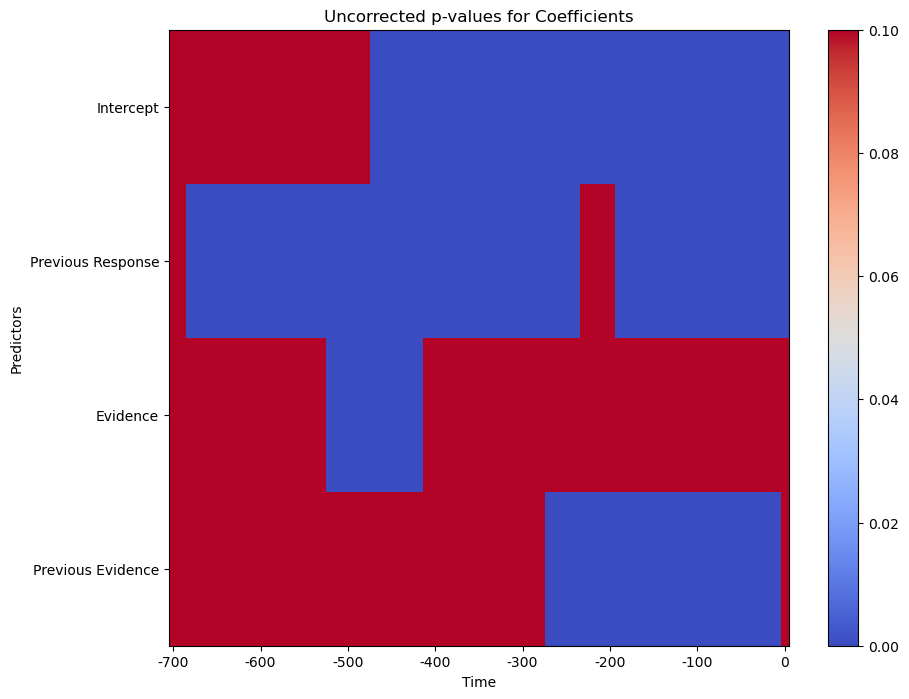

In [18]:
# Create a heatmap of p-values
swp = p_values.swapaxes(0, 1)
plt.figure(figsize=(10, 8))
plt.imshow(swp < 0.05, cmap='coolwarm', aspect='auto', vmin=0, vmax=0.1)  # Setting vmin=0 and vmax=1 to ensure p-values are within the colormap range
plt.colorbar()
plt.xlabel('Time')
plt.ylabel('Predictors')
plt.title('Uncorrected p-values for Coefficients')
plt.xticks(range(71)[::10], np.arange(-700,10,100))  # Adjust ticks for better readability
plt.yticks(range(4), ['Intercept', 'Previous Response', 'Evidence', 'Previous Evidence'])  # Adjust labels for predictors
plt.show()

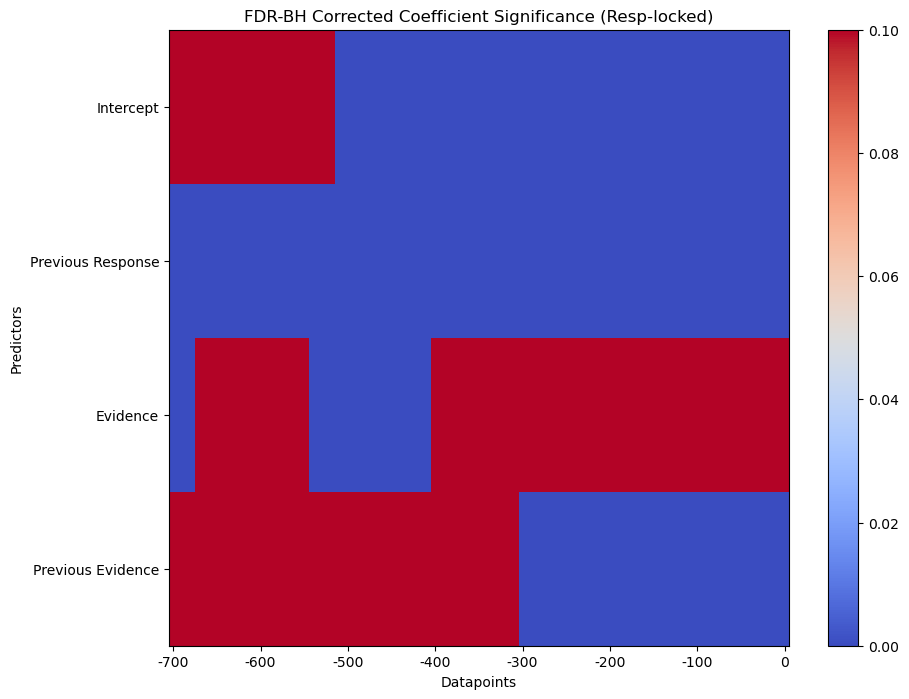

In [19]:
# Create a heatmap of p-values
swp = corrected_p_values.swapaxes(0, 1)
plt.figure(figsize=(10, 8))
plt.imshow(swp < 0.05, cmap='coolwarm', aspect='auto', vmin=0, vmax=0.1)  # Setting vmin=0 and vmax=1 to ensure p-values are within the colormap range
plt.colorbar()
plt.xlabel('Datapoints')
plt.ylabel('Predictors')
plt.title('FDR-BH Corrected Coefficient Significance (Resp-locked)')
plt.xticks(range(71)[::10], np.arange(-700,10,100))  # Adjust ticks for better readability
plt.yticks(range(4), ['Intercept', 'Previous Response', 'Evidence', 'Previous Evidence'])  # Adjust labels for predictors
plt.show()

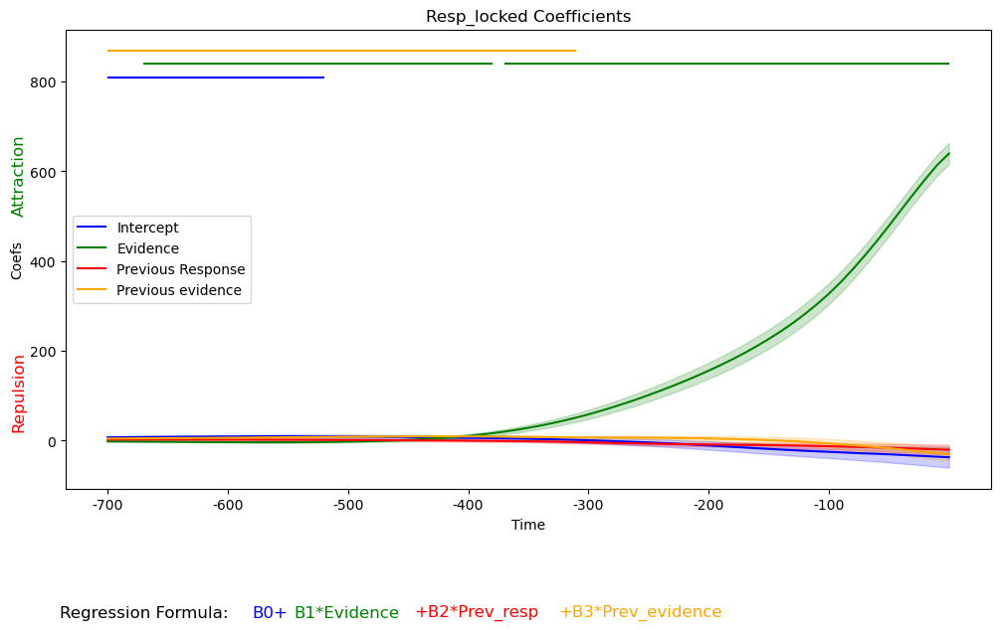

In [20]:
### Static Plot without Evidence
time = list(range(0, 71 * 10, 10))
plt.figure(figsize=(12, 6))
plt.plot(time, intercept_coefs, label='Intercept', color='blue')
plt.plot(time, evidence_coefs, label='Evidence', color='green')
plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_coefs - std_coefs[:, 0], intercept_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], prv_resp_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], prv_evidence_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
plt.fill_between(time, evidence_coefs - std_coefs[:, 2], evidence_coefs + std_coefs[:, 2], alpha=0.2, color='green')
plt.xlabel('Time')
plt.ylabel('Coefs')
plt.title('Resp_locked Coefficients')

# Add the regression formula as text
plt.text(-40, -400, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
plt.text(120, -400, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
plt.text(155, -400, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
plt.text(255, -400, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
plt.text(375, -400, '+B3*Prev_evidence', color='orange', fontsize=12, verticalalignment='bottom')

#Adding significant points
#Intercept
plt.hlines(810, min(p_indices[0]), max(p_indices[0]), colors='blue', linestyles='solid')
# Previous Response
#plt.hlines(930, min(p_indices[1]), max(p_indices[1]), colors='red', linestyles='solid')

#Evidence
plt.hlines(840, min(p_indices[2]), p_indices[2][15], colors = 'green', linestyle = 'solid')
plt.hlines(840, p_indices[2][16], max(p_indices[2]), colors = 'green', linestyle = 'solid')

# Previous Evidence
plt.hlines(870, min(p_indices[3]), max(p_indices[3]), colors='orange', linestyles='solid')

plt.xticks(np.arange(0,700,100),labels =(np.arange(-700, 0, 100)))

plt.text(-80, 500, 'Attraction', color='green', fontsize=12,rotation = 90, verticalalignment='bottom')
plt.text(-80, 200, 'Repulsion', color='red', fontsize=12, rotation = 90, verticalalignment='top')
#plt.ylim(-60, 60)


plt.legend(loc = 'center left')
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, intercept_coefs.max())
plt.show()

### Doing the same line of Analysis with T-values rather than Beta Coefficients

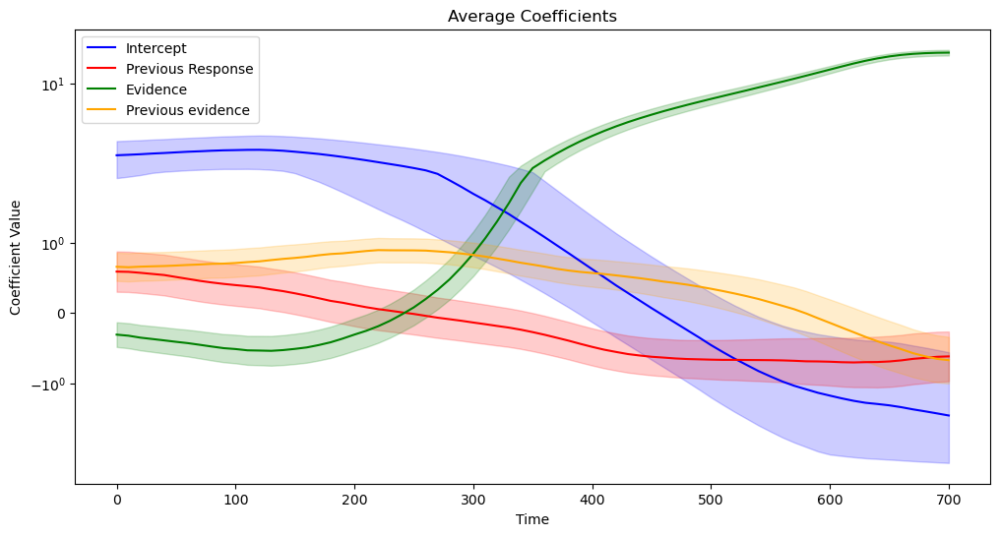

In [21]:
# Convert the list of t values to a numpy array
all_Ts_array = np.array(all_Ts)

# Calculate the average of each t value across all samples
average_Ts = np.mean(all_Ts_array, axis=0)
# Extract the t values of the coefficients
intercept_Ts = average_Ts[:, 0]
prv_resp_Ts = average_Ts[:, 1]
evidence_Ts = average_Ts[:, 2]
prv_evidence_Ts = average_Ts[:, 3]

std_Ts = np.std(all_Ts_array, axis=0, ddof=1) / np.sqrt(all_Ts_array.shape[0])

# Doing the T version of above plot
plt.figure(figsize=(12, 6))
plt.plot(time, intercept_Ts, label='Intercept', color='blue')
plt.plot(time, prv_resp_Ts, label='Previous Response', color='red')
plt.plot(time, evidence_Ts, label='Evidence', color='green')
plt.plot(time, prv_evidence_Ts, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_Ts - std_Ts[:, 0], intercept_Ts + std_Ts[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_Ts - std_Ts[:, 1], prv_resp_Ts + std_Ts[:, 1], alpha=0.2, color='red')
plt.fill_between(time, evidence_Ts - std_Ts[:, 2], evidence_Ts + std_Ts[:, 2], alpha=0.2, color='green')
plt.fill_between(time, prv_evidence_Ts - std_Ts[:, 3], prv_evidence_Ts + std_Ts[:, 3], alpha=0.2, color='orange')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
#plt.yscale('log')
plt.title('Average Coefficients')
# Add the regression formula as text
#plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
#plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
#plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
#plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
#plt.xticks(np.arange(-100, 710, 100))
#plt.ylim(-100, 960)
#plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
plt.yscale('symlog')
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, x_coefs.max() + factor)
plt.show()

# Assuming your average coefs data is stored in the variable 'average_coefs'
#log_average_coefs = np.log(average_coefs)

In [22]:
import numpy as np
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests

# Assuming `all_coefs_array` is a 3D array with shape (participants, coefficients, predictors)
# Modify this part according to your actual data structure

# Reshape the array to swap the dimensions so that each row corresponds to a coefficient across all participants
all_Ts_array_reshaped = np.swapaxes(all_Ts_array, 0, 1)  # Shape: (coefficients, participants, predictors)

# Initialize arrays to store t-statistics and p-values
# We have 81 datapoints per coefficient and 4 predictors, hence the shape (81, 4)
t_statistics = np.zeros((71, 4))  
p_values = np.zeros((71, 4))
p_indices = []      

# Loop over each coefficient
for i, coefficient_data in enumerate(all_coefs_array_reshaped):
    # Loop over each predictor
    for j in range(4):  
        # Perform a one-sample t-test for the current coefficient's data
        # The null hypothesis is that the mean of the data is 0
        t_statistic, p_value = ttest_1samp(coefficient_data[:, j], 0)
        
        # Store the t-statistic and p-value
        t_statistics[i, j] = t_statistic
        p_values[i, j] = p_value

# Apply False Discovery Rate (FDR) correction to p-values for each predictor
# This is done to control the expected proportion of incorrectly rejected null hypotheses (type I errors)
reject, corrected_p_values, _, _ = multipletests(p_values.flatten(), method='fdr_bh')

# Reshape the corrected p-values to have the same shape as the original p-values
corrected_p_values = corrected_p_values.reshape(p_values.shape)

# Loop over each predictor
for predictor_idx, predictor_p_values in enumerate(corrected_p_values.T):
    # Find the indices of the coefficients for which the corrected p-value is less than 0.05
    # These are the coefficients for which the effect of the predictor is statistically significant
    significant_indices = np.where(predictor_p_values < 0.05)[0]
    p_indices.append(significant_indices)
    # Get the significant t-statistics and p-values
    significant_t_statistics = t_statistics[significant_indices, predictor_idx]
    significant_p_values = predictor_p_values[significant_indices]
    
    # Print the significant results
    for idx, t_statistic, p_value in zip(significant_indices, significant_t_statistics, significant_p_values):
        print(f"Predictor {predictor_idx+1}, Coefficient {idx}: t-statistic = {t_statistic}, p-value (FDR corrected) = {p_value}")
p_indices = [value * 10 for value in p_indices]

Predictor 1, Coefficient 0: t-statistic = 2.8938138475471487, p-value (FDR corrected) = 0.01775193201710331
Predictor 1, Coefficient 1: t-statistic = 2.925097974039231, p-value (FDR corrected) = 0.016861286281198665
Predictor 1, Coefficient 2: t-statistic = 2.956761593088388, p-value (FDR corrected) = 0.015722073208547113
Predictor 1, Coefficient 3: t-statistic = 2.9916021607234455, p-value (FDR corrected) = 0.014715693669588225
Predictor 1, Coefficient 4: t-statistic = 3.017635620902015, p-value (FDR corrected) = 0.014202387969580536
Predictor 1, Coefficient 5: t-statistic = 3.0334800879539356, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 6: t-statistic = 3.0437811803419224, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 7: t-statistic = 3.0367867210958353, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient 8: t-statistic = 3.030284210265254, p-value (FDR corrected) = 0.013883888985828558
Predictor 1, Coefficient

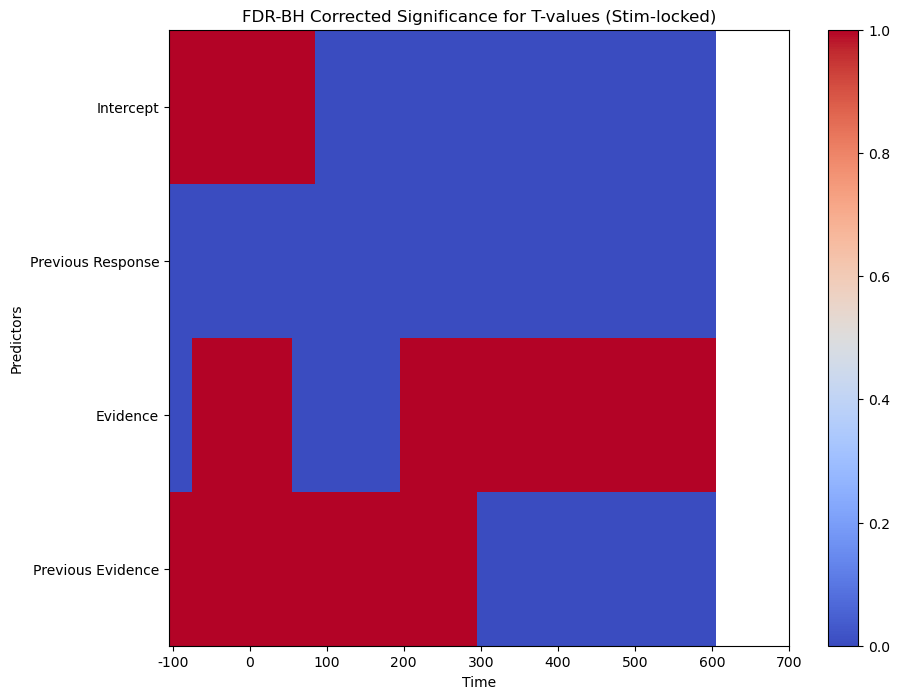

In [23]:
# Create a heatmap of p-values
swp = corrected_p_values.swapaxes(0, 1)
plt.figure(figsize=(10, 8))
plt.imshow(swp < 0.05, cmap='coolwarm', aspect='auto', vmin=0, vmax=1)  # Setting vmin=0 and vmax=1 to ensure p-values are within the colormap range
plt.colorbar()
plt.xlabel('Time')
plt.ylabel('Predictors')
plt.title('FDR-BH Corrected Significance for T-values (Stim-locked)')
plt.xticks(range(81)[::10], np.arange(-100,710, 100))  # Adjust ticks for better readability
plt.yticks(range(4), ['Intercept', 'Previous Response', 'Evidence', 'Previous Evidence'])  # Adjust labels for predictors
plt.show()

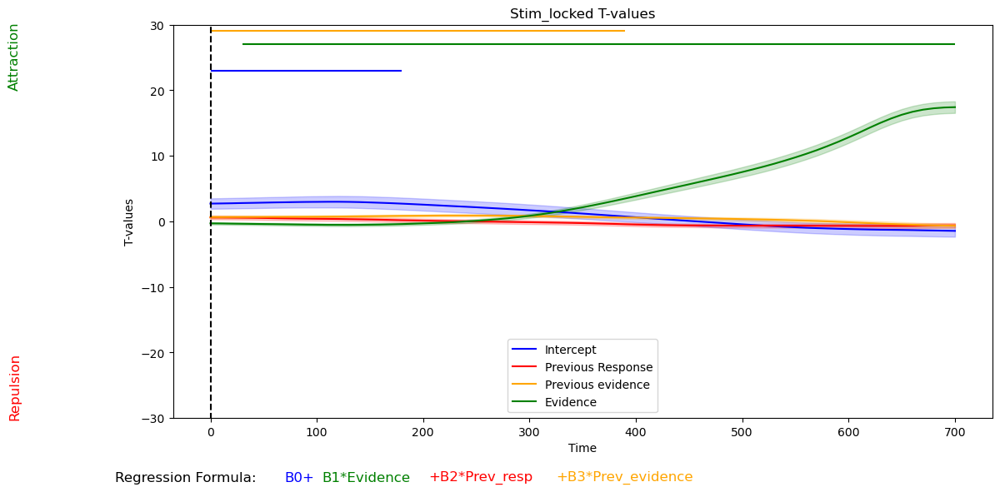

In [24]:
### Static Plot with Evidence
plt.figure(figsize=(12, 6))
plt.plot(time, intercept_Ts, label='Intercept', color='blue')
plt.plot(time, prv_resp_Ts, label='Previous Response', color='red')
plt.plot(time, prv_evidence_Ts, label='Previous evidence', color='orange')
plt.plot(time, evidence_Ts, label='Evidence', color='green')

plt.fill_between(time, intercept_Ts - std_Ts[:, 0], intercept_Ts + std_Ts[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_Ts - std_Ts[:, 1], prv_resp_Ts + std_Ts[:, 1], alpha=0.2, color='red')
plt.fill_between(time, prv_evidence_Ts - std_Ts[:, 3], prv_evidence_Ts + std_Ts[:, 3], alpha=0.2, color='orange')
plt.fill_between(time, evidence_Ts - std_Ts[:, 2], evidence_Ts + std_Ts[:, 2], alpha=0.2, color='green')

plt.xlabel('Time')
plt.ylabel('T-values')
plt.title('Stim_locked T-values')

# Add the regression formula as text
plt.text(-90, -40, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
plt.text(70, -40, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
plt.text(105, -40, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
plt.text(205, -40, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
plt.text(325, -40, '+B3*Prev_evidence', color='orange', fontsize=12, verticalalignment='bottom')


#Adding significant points
#Intercept
plt.hlines(23, min(p_indices[0]), max(p_indices[0]), colors='blue', linestyles='solid')
# Previous Response
#plt.hlines(21, p_indices[1][0], p_indices[1][30], colors='red', linestyles='solid')

#plt.hlines(25, p_indices[1][31],max(p_indices[1]), colors='red', linestyles='solid')

#Evidence
plt.hlines(27, min(p_indices[2]), max(p_indices[2]), colors = 'green', linestyle = 'solid')

# Previous Evidence
plt.hlines(29, min(p_indices[3]), max(p_indices[3]), colors='orange', linestyles='solid')

plt.xticks(np.arange(-100, 710, 100))
plt.text(-190, 20, 'Attraction', color='green', fontsize=12,rotation = 90, verticalalignment='bottom')
plt.text(-190, -20, 'Repulsion', color='red', fontsize=12, rotation = 90, verticalalignment='top')

plt.vlines(0, -70, 60, colors='black', linestyles='dashed')


plt.ylim(-30,30)
plt.tight_layout()
plt.legend(loc = 'lower center')

plt.show()

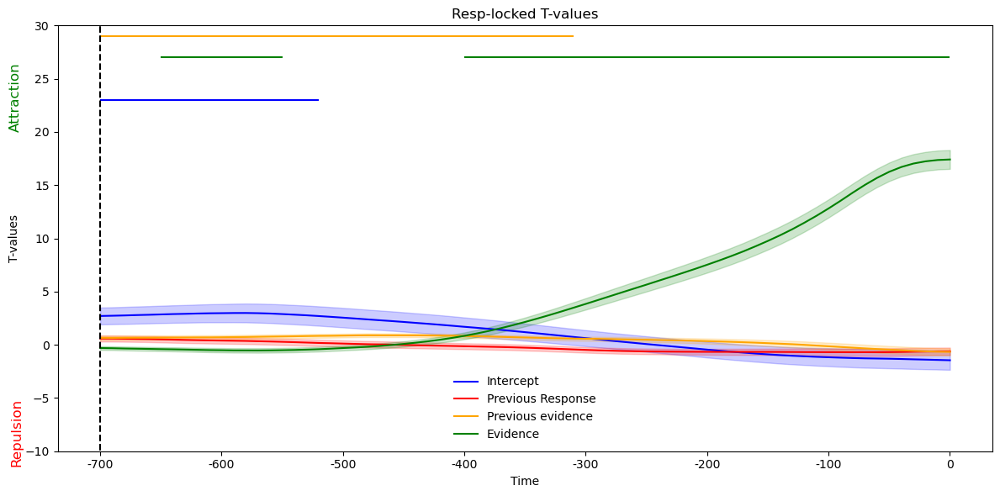

In [32]:
### FOR POSTER

### Static Plot with Evidence
plt.figure(figsize=(12, 6))
plt.plot(time, intercept_Ts, label='Intercept', color='blue')
plt.plot(time, prv_resp_Ts, label='Previous Response', color='red')
plt.plot(time, prv_evidence_Ts, label='Previous evidence', color='orange')
plt.plot(time, evidence_Ts, label='Evidence', color='green')

plt.fill_between(time, intercept_Ts - std_Ts[:, 0], intercept_Ts + std_Ts[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_Ts - std_Ts[:, 1], prv_resp_Ts + std_Ts[:, 1], alpha=0.2, color='red')
plt.fill_between(time, prv_evidence_Ts - std_Ts[:, 3], prv_evidence_Ts + std_Ts[:, 3], alpha=0.2, color='orange')
plt.fill_between(time, evidence_Ts - std_Ts[:, 2], evidence_Ts + std_Ts[:, 2], alpha=0.2, color='green')

plt.xlabel('Time')
plt.ylabel('T-values')
plt.title('Resp-locked T-values')
"""
# Add the regression formula as text
plt.text(-90, -40, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
plt.text(70, -40, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
plt.text(105, -40, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
plt.text(205, -40, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
plt.text(325, -40, '+B3*Prev_evidence', color='purple', fontsize=12, verticalalignment='bottom')
"""

#Adding significant points
#Intercept
plt.hlines(23, min(p_indices[0]), max(p_indices[0]), colors='blue', linestyles='solid')
# Previous Response
#plt.hlines(21, p_indices[1][0], p_indices[1][30], colors='red', linestyles='solid')

#plt.hlines(25, p_indices[1][31],max(p_indices[1]), colors='red', linestyles='solid')

#Evidence
plt.hlines(27, (p_indices[2][2]), (p_indices[2][12]), colors = 'green', linestyle = 'solid')
#Evidence
plt.hlines(27, (p_indices[2][13]), max(p_indices[2]), colors = 'green', linestyle = 'solid')

# Previous Evidence
plt.hlines(29, min(p_indices[3]), max(p_indices[3]), colors='orange', linestyles='solid')

plt.xticks(np.arange(0, 710, 100), labels=(np.arange(-700, 10, 100)))
plt.text(-75, 20, 'Attraction', color='green', fontsize=12,rotation = 90, verticalalignment='bottom')
plt.text(-74, -5, 'Repulsion', color='red', fontsize=12, rotation = 90, verticalalignment='top')

plt.vlines(0, -70, 60, colors='black', linestyles='dashed')
#plt.hlines(0, -100, 700, colors='black', linestyles='dashed')


plt.ylim(-10,30)
plt.tight_layout()
plt.legend(loc='lower center', framealpha=0)
plt.savefig("plot_resp.png", transparent=True, dpi=1000)
plt.show()

In [26]:
p_indices[1]

array([], dtype=int64)

### Conclusion
Here we have run the stimulus-locked analysis on the mouse data. We have seen that the sequential effects has a significant effect on the mouse trajectory. We will conduct the same line of analysis again with resp-locked data to see if the results are consistent across different alignment points as well as beginning locked dataset.